In [27]:
#Used for displaying plots below the cell, inverts %matplotlib inline
%matplotlib inline
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sn

from collections import defaultdict
from collections import OrderedDict
from scipy.stats.stats import pearsonr

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances, silhouette_samples, silhouette_score, davies_bouldin_score
from sklearn import metrics

from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist #Condensed matrix output

import mpl_toolkits.mplot3d.axes3d as p3

from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

# Task 2: Clustering

## Methodology  
In order to perform the analysis we started by taking a look at the various techniques suggested in order to get an approximative idea of the parameters for each type of clustering, we then tweaked the results based on the values of the applicable metrics and finally confirmed the validity of the results through a 3d visualisation of the clusters with PCA.

In [101]:
vendor_df_num = pd.read_csv('./task1-result_num.csv', sep=',', index_col=[0,1])
vendor_df_cat = pd.read_csv('./task1-result_cat.csv', sep=',', index_col=[0,1])

In [5]:
vendor_df_num.head()

,,I,Iu,MaxValuePerOrder,AvgValuePerOrder,TotMonthBusiness,Eram,Egeo,Ecur
vendor_code,name,,,,,,,,
1,1stWave Technologies,774,60,565.439098,132.989886,25,5.361843,0.643988,0.643988
2,Adorama,3274,186,1761.990000,146.248003,20,6.754711,0.000000,0.000000
3,Alternate,3047,203,860.154236,155.134195,3,7.373634,1.679995,0.000000
4,Alternate Italia,407,101,774.077840,142.140184,2,6.486558,0.898296,0.898296
5,Alza,12959,276,1188.115658,166.036705,17,7.612859,1.165894,1.094659


In [6]:
vendor_df_cat.head()

,,TopBrand,TopCountry
vendor_code,name,,
1,1stWave Technologies,CORSAIR,New Zeland
2,Adorama,CRUCIAL,United States of America
3,Alternate,G.SKILL,France
4,Alternate Italia,G.SKILL,Italy
5,Alza,KINGSTON,United Kingdom


## Normalization

In [7]:
vend_scaler = MinMaxScaler()
vend_scaler.fit(vendor_df_num.values)
vendor_norm = vend_scaler.transform(vendor_df_num.values)
vendor_df_norm = pd.DataFrame(vendor_norm)

We then apply PCA.

In [8]:
pca = PCA(n_components=3)
vendor_pca = pca.fit_transform(vendor_norm) #We need the normalised data
print(f"Variance explained by PCA components: {pca.explained_variance_ratio_.sum()}")
vendor_df_pca = pd.DataFrame(vendor_pca)

Variance explained by PCA components: 0.7914398367782686


## Auxiliary functions

### Miscellaneous

In [161]:
def compute_cluster_means(points_values, labels):
    
    clust_mean = pd.DataFrame()
    for label in sorted(np.unique(labels)):
        
        cur_clust = []
        
        for id_p in range(len(points_values)):
            if(label == labels[id_p]):
                cur_clust.append(points_values[id_p])
        cur_clust_df = pd.DataFrame(cur_clust)
        clust_mean = clust_mean.append(cur_clust_df.mean(), ignore_index=True)

    clust_mean = np.array(clust_mean)
    
    return clust_mean

def compute_cluster_stds(points_values, labels):
    
    clust_std = pd.DataFrame()
    for label in sorted(np.unique(labels)):
        
        cur_clust = []
        
        for id_p in range(len(points_values)):
            if(label == labels[id_p]):
                cur_clust.append(points_values[id_p])
        cur_clust_df = pd.DataFrame(cur_clust)
        clust_std = clust_std.append(cur_clust_df.std(), ignore_index=True)

    clust_std = np.array(clust_std.replace(np.nan, 0))
    
    return clust_std

def compute_ideal_similarity_coeff(data_points, cluster_labels):
    
    proximity_matrix = pairwise_distances(data_points)
    
    ideal_matrix = np.empty((len(cluster_labels), len(cluster_labels)))
    
    for i in range(len(cluster_labels) - 1):
        for j in range(i, len(cluster_labels)):
            
            if(cluster_labels[i] == cluster_labels[j]):
                ideal_matrix[i][j] = 1
                ideal_matrix[j][i] = 1
        
    res = np.corrcoef(ideal_matrix, proximity_matrix)
    
    return res

def cluster_dimensions(labels):
    
    label_dict = {x:0 for x in sorted(np.unique(labels))}
    
    for i in range(len(labels)):
        label_dict[labels[i]] = label_dict[labels[i]] + 1
    
    return label_dict

def count_singletons(labels):
    
    dim_list = list(cluster_dimensions(labels).values())

    return dim_list.count(1)

def close_figs():
    plt.close("all")

### X-means  
Compatibility class to use pyclustering's xmeans same as a sklearn model.

In [10]:
class xmeans_sk:
    
    __amount_initial_centers = 1
    __n_init = 10
    __init = None
    
    labels_ = []
    
    def __init__(self, n_clusters=8, init="k-means++", n_init=10, max_iter=300):
        self.__amount_initial_centers = n_clusters
        self.__n_init = n_init
        self.__init = init
        
    def set_params(self, **params):
        
        for key, value in params.items():
            if(key == "n_clusters"):
                self.__amount_initial_centers = value
        
    def fit(self, X):
        
        best_silhouette = -1
        best_labels = []
        
        for i in range(self.__n_init):
            
            if(isinstance(self.__init, str) and self.__init == "k-means++"):
                # Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
                # start analysis.
                initial_centers = kmeans_plusplus_initializer(X, self.__amount_initial_centers).initialize()
                
            elif(isinstance(self.__init, np.ndarray)):
                initial_centers = self.__init
            else:
                raise RuntimeError("init can be 'k-means++' or a numpy ndarray containing the centers")
            
            # Create instance of X-Means algorithm. The maximum number of clusters that can be allocated is 20.
            xmeans_out = xmeans(X, initial_centers, 20)
            xmeans_out.process()

            # Extract clustering results: clusters and their centers
            clusters = xmeans_out.get_clusters()
            centers = xmeans_out.get_centers()

            cluster_labels = pyclust_sklearn_cluster_conv(clusters)
            
            cur_sil = silhouette_score(X, cluster_labels)
            
            if(cur_sil > best_silhouette):
                best_silhouette = cur_sil
                best_labels = cluster_labels
                
        self.labels_ = best_labels
        
        return self
    

#Change cluster representation format from pyclustering to sklearn representation
def pyclust_sklearn_cluster_conv(pyclust_array):
    
    tot_len = 0
    
    for array in pyclust_array:
        tot_len = tot_len + len(array)
    
    out_array = np.empty(tot_len, dtype=int)
    
    for i in range(len(pyclust_array)):
        
        for value in pyclust_array[i]:
            out_array[value] = i
            
    return out_array

### Visualisation

In [179]:
def plot_metrics(metrics_dict, x_name, x_list, xticks_list):
    
    plt.figure(figsize=(17,5))
    
    for metric in metrics_dict.keys():
            
        if(metric.lower() == "sse"):
            sse_list = np.reshape(metrics_dict[metric], (-1, 1))
            
            #Scaler for visualisation purposes
            local_scaler = MinMaxScaler()
            local_scaler.fit(sse_list)
            std_sse_list = local_scaler.transform(sse_list)
            
            plt.plot(x_list, std_sse_list, label='SSE')
        elif(metric.lower() == "db"):
            plt.plot(x_list, metrics_dict[metric], label='Davies-Bouldin')
        elif(metric.lower() == "sil"):
            plt.plot(x_list, metrics_dict[metric], label='Silhouette')
        elif(metric.lower() == "noise_ratio"):
            plt.plot(x_list, metrics_dict[metric], label='Noise ratio')
        elif(metric.lower() == "clusters"):
            for i in range(len(metrics_dict["clusters"])):
                plt.scatter(x_list[i], 1, marker=f"${metrics_dict['clusters'][i]}$")
        else:
            raise RuntimeError

    plt.xlabel(x_name, fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=18)
    plt.xticks(xticks_list)
    plt.legend()
    plt.show()

    
def plot_metrics_per_k(data_points, metrics_arr, model_sk=None):
    max_k = 40
    metrics_dict = {}
    
    for metric in metrics_arr:
        metrics_dict[metric] = list()

    for k in range(2, max_k + 1): #Starting from k=2 to k=40
        
        if model_sk:
            model_sk.set_params(**{"n_clusters":k})
            model_sk.fit(data_points)
            cluster_labels = model_sk.labels_
        else:
            raise RuntimeError
            
        for metric in metrics_arr:
            
            if(metric.lower() == "sse"):
                metrics_dict[metric].append(model_sk.inertia_)
            elif(metric.lower() == "db"):
                metrics_dict[metric].append(davies_bouldin_score(data_points, cluster_labels))
            elif(metric.lower() == "sil"):
                metrics_dict[metric].append(silhouette_score(data_points, cluster_labels))
            else:
                raise RuntimeError
                
    plot_metrics(metrics_dict, "K", np.arange(2, max_k+1, 1), np.arange(0, max_k+1, 2))
    
    
def plot_metrics_per_eps(data_points, metrics_arr, max_eps=3, precision=0.10, model_sk=None):
    metrics_dict = {}
    eps_list = list()
    
    
    for metric in metrics_arr:
        metrics_dict[metric] = list()
        
    for i in range(int(max_eps//precision)):
        
        e = i*precision
        if(e == 0):
            e = precision
        
        if model_sk:
            model_sk.set_params(**{"eps":e})
            model_sk.fit(data_points)
            cluster_labels = model_sk.labels_
            
            # Avoid problem with silhouette and singleton cluster
            if(len(np.unique(cluster_labels)) >= 2):
                eps_list.append(e)
            else:
                continue
            
        else:
            raise RuntimeError
            
        for metric in metrics_arr:
            
            if(metric.lower() == "db"):
                metrics_dict[metric].append(davies_bouldin_score(data_points, cluster_labels))
            elif(metric.lower() == "sil"):
                metrics_dict[metric].append(silhouette_score(data_points, cluster_labels))
            elif(metric.lower() == "noise_ratio"):
                metrics_dict[metric].append(list(cluster_labels).count(-1)/len(cluster_labels))
            elif(metric.lower() == "clusters"):
                metrics_dict[metric].append(len(np.unique(cluster_labels)))
            else:
                raise RuntimeError
                
    plot_metrics(metrics_dict, "Eps", eps_list, eps_list)
    
    
#https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html
def plot_dendrogram(model, max_d=[0], **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples] #Non-leaf node indexing
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)
    
    plt.figure(figsize=(10, 5))
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.ylabel("Distance")
    
    # Plot the corresponding dendrogram
    dendrogram(
        linkage_matrix, 
        leaf_rotation=90.,  # rotates the x axis labels
        leaf_font_size=8.,  # font size for the x axis labels
        **kwargs)
    
    if max_d[0] != 0:
        for i in max_d:
            plt.axhline(y=i, c='k')
        
    plt.show()

    
#Useful because it works with simple arrays
def plot_parallel_lines(data_points, labels_list, title=None):
    
    if(title != None):
        plt.title(title)
    
    for i in range(0, len(data_points)):
        colors = plt.cm.rainbow(np.linspace(0, 1, len(np.unique(labels_list))))
        plt.plot(data_points[i], marker='o', label='Cluster %s' % labels_list[i], color=colors[labels_list[i]])
        
    plt.tick_params(axis='both', which='major')
    plt.xticks(range(0, len(vendor_df_num.columns)), vendor_df_num.columns, rotation=90)
    plt.legend(fontsize=10)
    

def plot_knn_dist(nearest_n_list, datapoints_list):

    if(len(datapoints_list) != len(nearest_n_list)):
        raise RuntimeException
        
    list_len = len(nearest_n_list)
    nearest_dist_list = list()
    
    for i in range(list_len):
        
        nbrs = NearestNeighbors(n_neighbors=nearest_n_list[i], algorithm='ball_tree').fit(datapoints_list[i])
        distances, indices = nbrs.kneighbors(datapoints_list[i])

        nearest_dist_list.append(
            pd.DataFrame(distances)[nearest_n_list[i]-1].sort_values().reset_index()\
            .rename({"index":"orig_point", nearest_n_list[i]-1:"distance"}, axis=1)
        )

    # Knndistplot
    fig = plt.figure(figsize=(20, 5)) 
    fig_dims = (1, list_len)
    fig.subplots_adjust(hspace=0.2, wspace=0.2)
        
    for i in range(list_len):

        plt.subplot2grid(fig_dims, (0, i))
        plt.title("Knn-distplot")
        nearest_dist_list[i]["distance"].plot()
        plt.xlabel("Points sorted by distance")
        plt.ylabel(f"Distance to the {nearest_n_list[i]}-nth neighbour")

    plt.show()


# Note: run %matplotlib notebook to enable interactivity
def plot_3d_scatter(data_points_list, labels_list=None):
    
    if(labels_list):
        if(len(data_points_list) != len(labels_list)):
            raise RuntimeError
        
    list_size = len(data_points_list)
    entries_dim = len(data_points_list[0])
    
    #If greater than 3 dimensions, use pca to reduce to 3
    if entries_dim > 3:
        data_points_list = data_points_list.copy()
        for i in range(len(data_points_list)):
            data_points_list[i] = pd.DataFrame(PCA(n_components=3).fit_transform(data_points_list[i]))
    
    if(list_size == 1):
        fig = plt.figure(figsize=(10+5*list_size,10+5*list_size))
    else:
        fig = plt.figure(figsize=(5*list_size,5*list_size))
    
    for i in range(list_size):
        
        #2 blocks per row
        ax = fig.add_subplot((list_size+1)//2, 2, i+1, projection='3d') #row, column, index
        X = data_points_list[i].copy()
        
        if(labels_list):

            if(len(data_points_list[i]) != len(labels_list[i])):
                raise RuntimeError

            X.loc[:, "label"] = labels_list[i]
            #Use color maps to assign colors automatically
            colors = plt.cm.rainbow(np.linspace(0, 1, len(np.unique(labels_list[i]))))

            for l in sorted(np.unique(labels_list[i])):
                ax.scatter(X.loc[X.label == l, 0], X.loc[X.label == l, 1], X.loc[X.label == l, 2],
                           color=colors[l],
                           s=20, edgecolor='k', label='Cluster %s' % l)
            
            plt.legend(fontsize=10)
        else:
            ax.scatter(X[0], X[1], X[2], s=20, edgecolor='k')

    plt.show()
    

def plot_sample_silhouette(data_points_list, k, labels):
    fig = plt.figure(figsize=(20, 5))
    
    # Silhouette scores per sample
    sample_sil_vals = silhouette_samples(data_points_list, labels)
    bar_colors = []
    y_lower = 10
    for i in range(k):
        #Group samples by cluster and sort by value
        clust_sil_vals = sample_sil_vals[labels == i]

        clust_sil_vals.sort()

        clust_size = clust_sil_vals.shape[0]
        y_upper = y_lower + clust_size

        color = plt.cm.rainbow(float(i) / k)
        bar_colors.append(color)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, clust_sil_vals, facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * clust_size, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("Silhouette plot")
    plt.xlabel("Silhouette coefficients")
    plt.ylabel("Cluster")

    # Silhouette average
    plt.axvline(x=silhouette_score(data_points_list, labels), linestyle="--")

    plt.yticks([])
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()


def visualise_model_characteristics(datapoints_list, model_list, 
                                    char_list=["general", "3d", "center", "std"], model_names=None):

    if(len(datapoints_list) != len(model_list)):
        raise RuntimeException

    list_dim = len(datapoints_list)

    if("general" in char_list):
        for i in range(list_dim):
            print(f"Clustering number {i}")
            print(f"Number of clusters: {len(np.unique(model_list[i].labels_))}")
            print(f"Number of points per cluster label: {cluster_dimensions(model_list[i].labels_)}")
            print(f"Number of singleton clusters: {count_singletons(model_list[i].labels_)}")
            print("\n")
            

    if("3d" in char_list):
        plot3d_labels = list()

        for i in range(list_dim):
            plot3d_labels.append(model_list[i].labels_)
        plot_3d_scatter(datapoints_list, plot3d_labels)

    if("center" in char_list):

        fig = plt.figure(figsize=(20, math.ceil(list_dim/2)*5))
        fig_dims = (math.ceil(list_dim/2), 2)
        fig.subplots_adjust(hspace=0.7, wspace=0.2)
        
        for i in range(list_dim):
            plt.subplot2grid(fig_dims, (i//2, i%2))
            plot_parallel_lines(compute_cluster_means(datapoints_list[i], model_list[i].labels_), sorted(np.unique(model_list[i].labels_)), \
                                f"Cluster centers (Clustering {i})")
            
        plt.show()
    
    if("std" in char_list):
        
        fig = plt.figure(figsize=(20, math.ceil(list_dim/2)*5))
        fig_dims = (math.ceil(list_dim/2), 2)
        fig.subplots_adjust(hspace=0.7, wspace=0.2)
        
        for i in range(list_dim):
            plt.subplot2grid(fig_dims, (i//2, i%2))
            plot_parallel_lines(compute_cluster_stds(datapoints_list[i], model_list[i].labels_), sorted(np.unique(model_list[i].labels_)), \
                                f"Cluster stds (Clustering {i})")
            plt.axhline(y=0.10)
        plt.show()

## Task 2.1: Prototype-based clustering

### Hierarchical hints

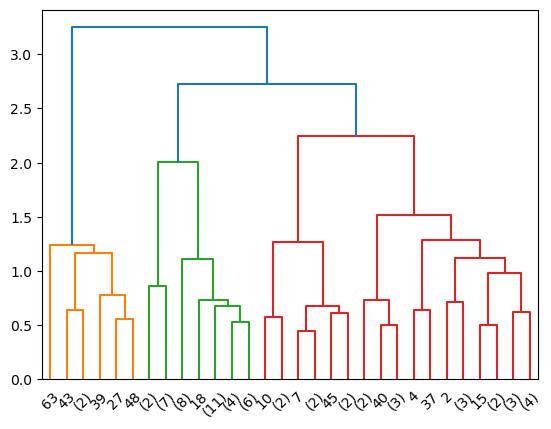

In [12]:
data_dist = pdist(vendor_norm, metric='euclidean')
data_link = linkage(data_dist, method='ward', metric='euclidean')
res = dendrogram(data_link, color_threshold=2.5, truncate_mode='lastp')

The hierarchical clustering (using the Ward method) suggests that the optimal number of clusters for this dataset is 3.

### K-means

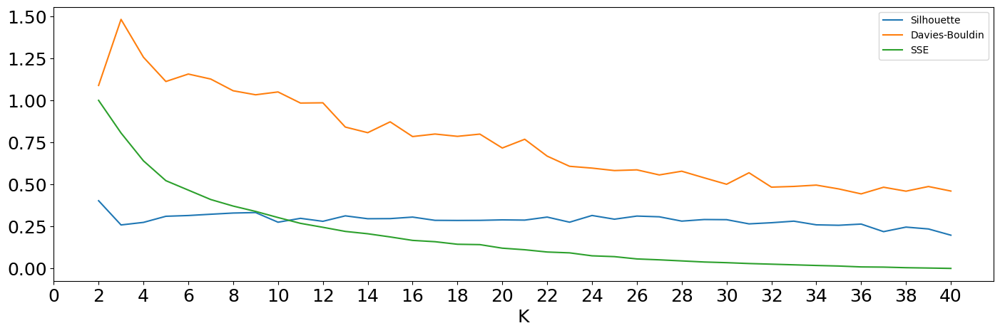

In [13]:
#The number of n_clusters is just for init purpouses
plot_metrics_per_k(vendor_df_norm, ["sil", "db", "sse"], model_sk=KMeans(n_clusters=1, n_init=20, max_iter=100))

The metrics plotted seem to suggest an optimal value for some value of k=[2,5], possibly with a slight preference for k=2.  
We will explore the outcome of these values.

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 9, 1: 68}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 43, 1: 7, 2: 27}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 4
Number of points per cluster label: {0: 19, 1: 37, 2: 7, 3: 14}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 5
Number of points per cluster label: {0: 18, 1: 31, 2: 11, 3: 10, 4: 7}
Number of singleton clusters: 0




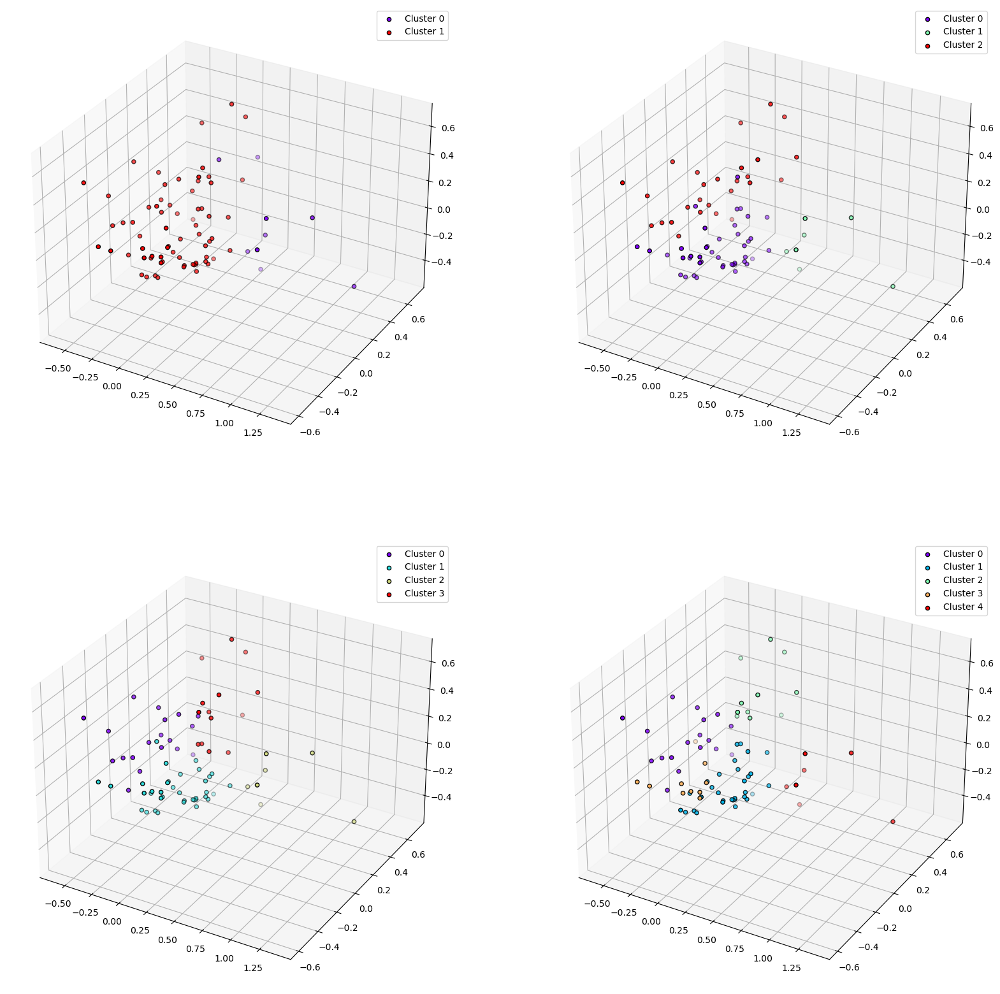

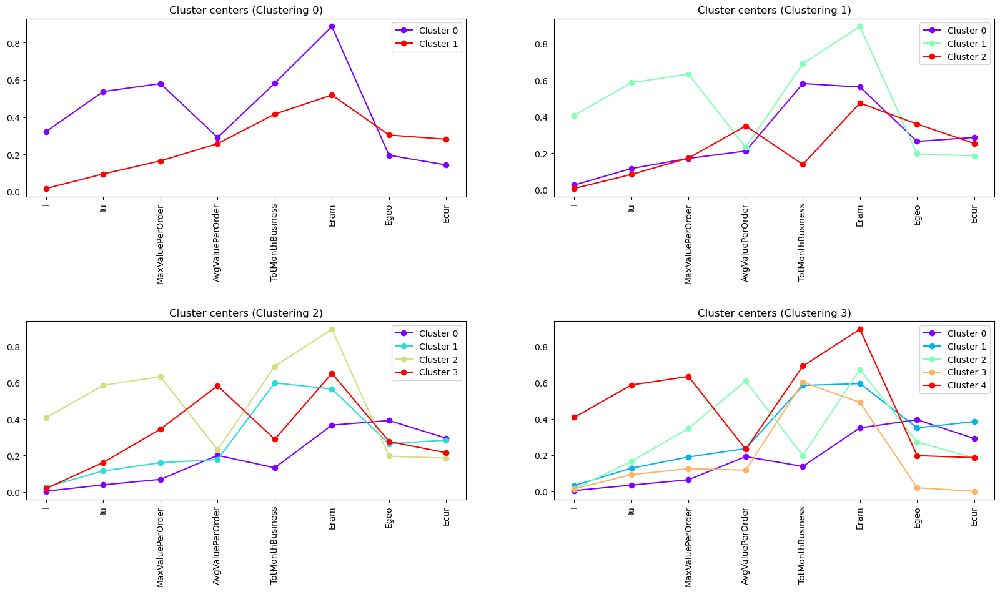

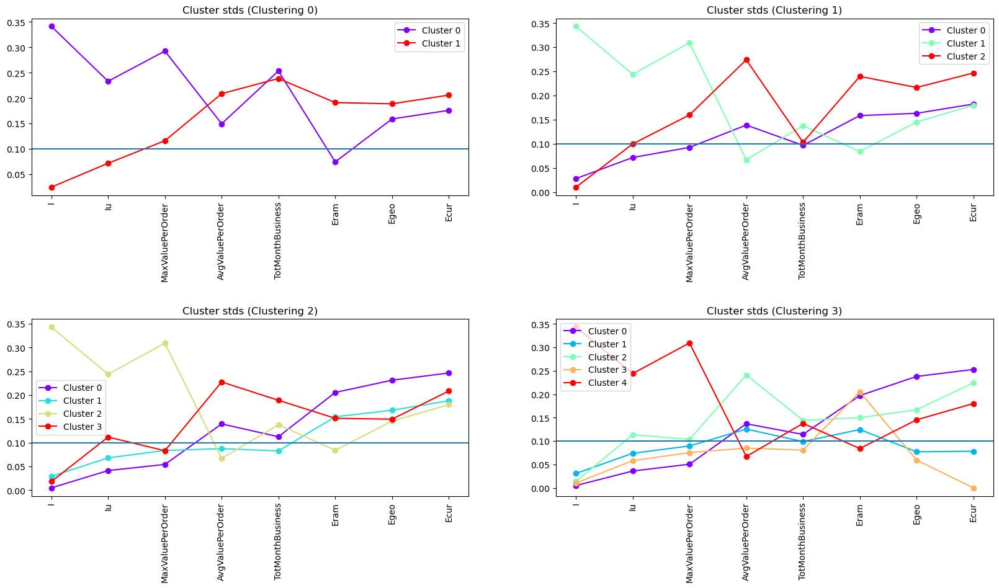

In [96]:
kmeans_clusters = [2,3,4,5]
kmeans_res = []

for i in kmeans_clusters:
    kmeans_res.append(KMeans(n_clusters=i, n_init=20, max_iter=100).fit(vendor_norm))

#Unfortunately it's not possible to make any guarantee that the clusters will have the same colors across clusterings
visualise_model_characteristics([vendor_norm]*len(kmeans_clusters), kmeans_res)

We can see that the cluster identified as "Cluster 1" in the first plot stays the same throughout all of the clusterings, it shows:
- A high value of I, Iu and MaxValuePerOrder for the cluster centers, however we also note that in the std plot the value for these features is high resulting in a wide range of values in the cluster.
- A high value for Eram and TotMonthBusiness for the cluster centers and a low std value, meaning that these high values are properties shared across the points in the cluster and therefore are a more stable characterisation of it.  

The other clusters are much more difficult to characterise:
- They share low values in the features of I with a low std primarily and in smaller part also for Iu
- By increasing the value of k to 3 we might be tempted to consider as a new defining cluster the one that has an higher than average value in AvgValuePerOrder, however by taking a look at the std we decide there is too much variability to consider it as such.

After these considerations we decide that it has no benefit to consider more than two clusters for the purpose of vendor segmentation.  
We don't have any easy label to assign to these clusters, "small" and "big" vendors are the most reasonable ones, however the come with the caveaut that, as we already pointed out, there are values of I/Iu in "Cluster 1" that are as low as those in "Cluster 0" but with respect to the average the labeling is valid.  

In [20]:
kmeans_final = kmeans_res[0]

### External indices

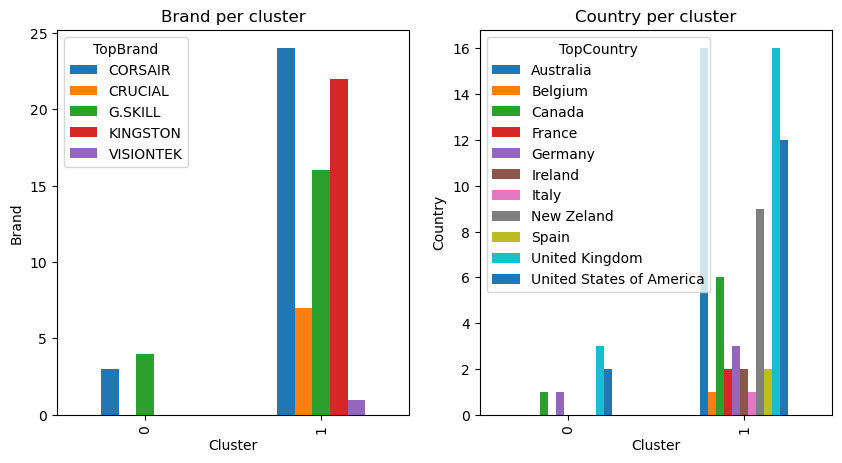

In [26]:
brand_xt_pct = pd.crosstab(kmeans_final.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(kmeans_final.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

In [31]:
ext_ind_kmeans=pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], kmeans_final.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], kmeans_final.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], kmeans_final.labels_, average_method='arithmetic'))

ext_ind_kmeans['Feature'] = temp
ext_ind_kmeans['Homogeneity'] = hom
ext_ind_kmeans['Completeness'] = compl
ext_ind_kmeans['Mutual Info'] = mutinfo
ext_ind_kmeans

,Feature,Homogeneity,Completeness,Mutual Information
0,TopBrand,0.038774,0.171824,0.063271
1,TopCountry,0.027953,0.183660,0.048521


### K-means (PCA)  
Here we apply k-means to a reduced dataset using PCA with 3 components and analyse the behaviour of the clustering with respect to the **original features**.

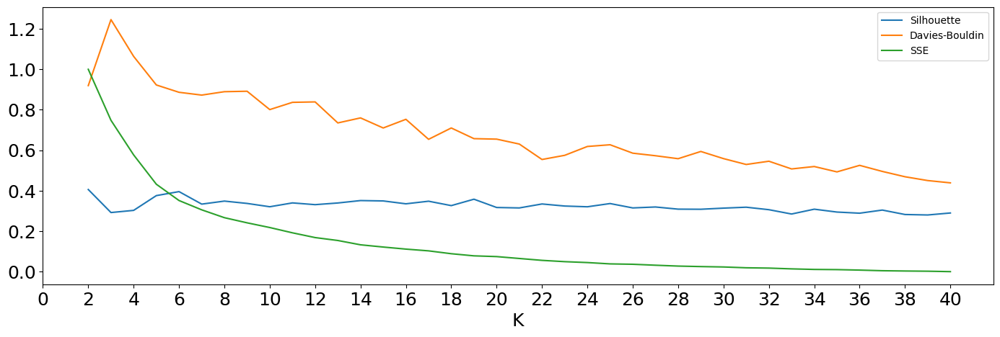

In [65]:
#The number of n_clusters is just for init purpouses
plot_metrics_per_k(vendor_df_pca, ["sil", "db", "sse"], model_sk=KMeans(n_clusters=1, n_init=20, max_iter=100))

Again the metrics plotted seem to suggest an optimal value for some value of k=[2,5].

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 69, 1: 8}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 8, 1: 39, 2: 30}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 4
Number of points per cluster label: {0: 18, 1: 28, 2: 7, 3: 24}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 5
Number of points per cluster label: {0: 31, 1: 10, 2: 7, 3: 12, 4: 17}
Number of singleton clusters: 0




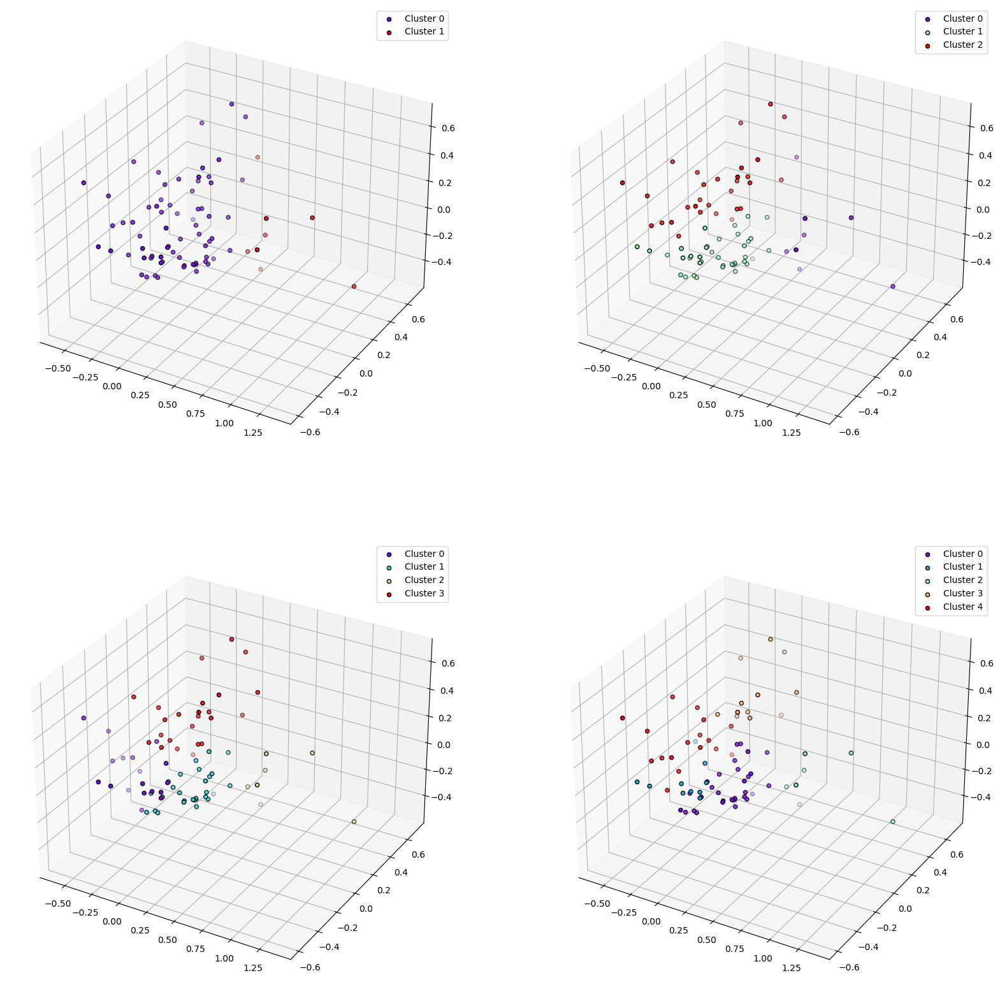

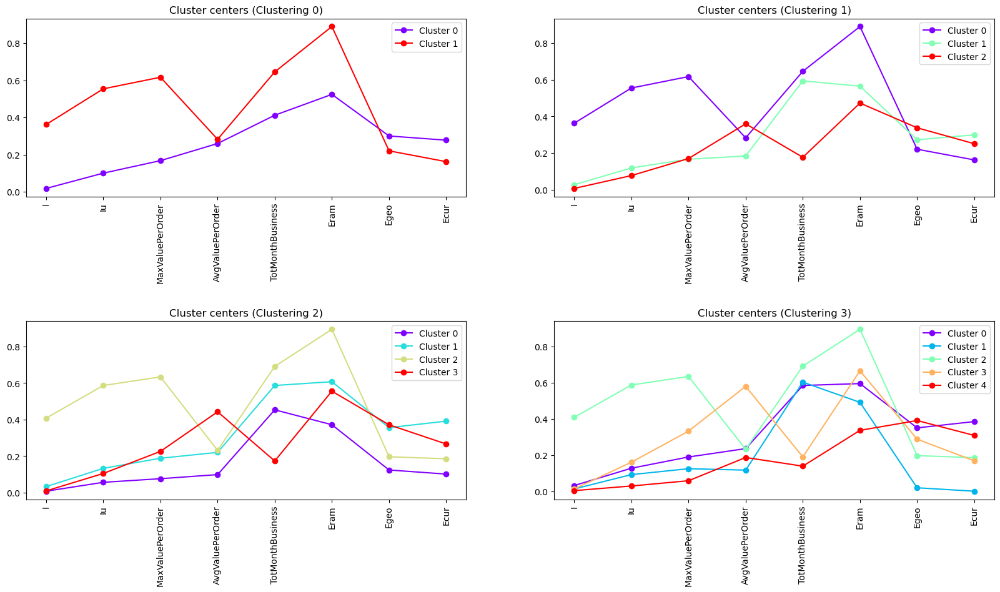

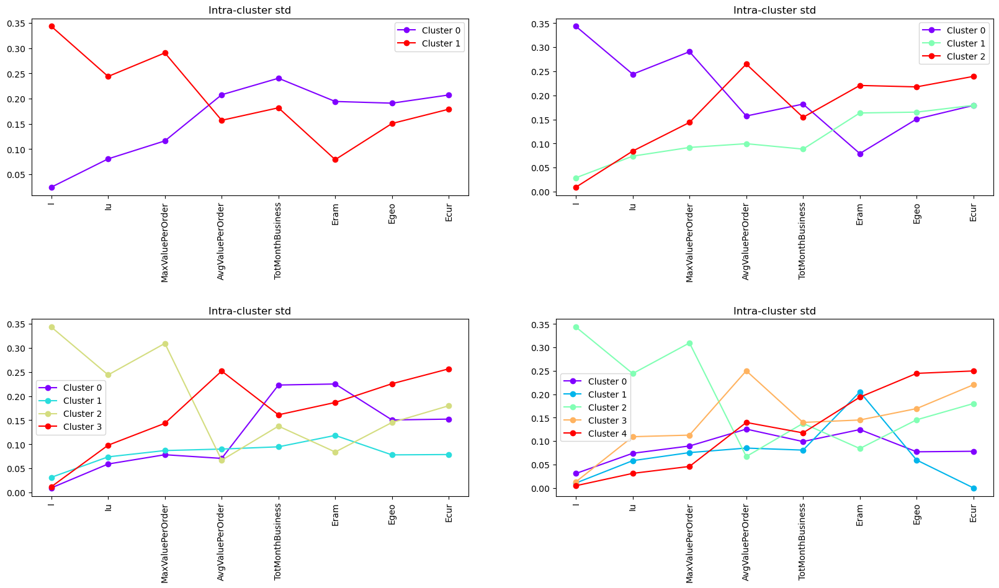

In [34]:
kmeans_clusters = [2,3,4,5]
kmeans_pca_res = []

for i in kmeans_clusters:
    kmeans_pca_res.append(KMeans(n_clusters=i, n_init=20, max_iter=100).fit(vendor_pca))

#We only use the labels from the clustering, the datapoints are from the normalised dataset
visualise_model_characteristics([vendor_norm]*len(kmeans_clusters), kmeans_pca_res)

The clustering is almost identical to the non-PCA version, probably due to the fact that both K-means and PCA attempt to minimise variance, on in the cluster and the other in the dataset. (TODO:recheck)

In [41]:
kmeans_pca_final = kmeans_pca_res[0]

### External indices

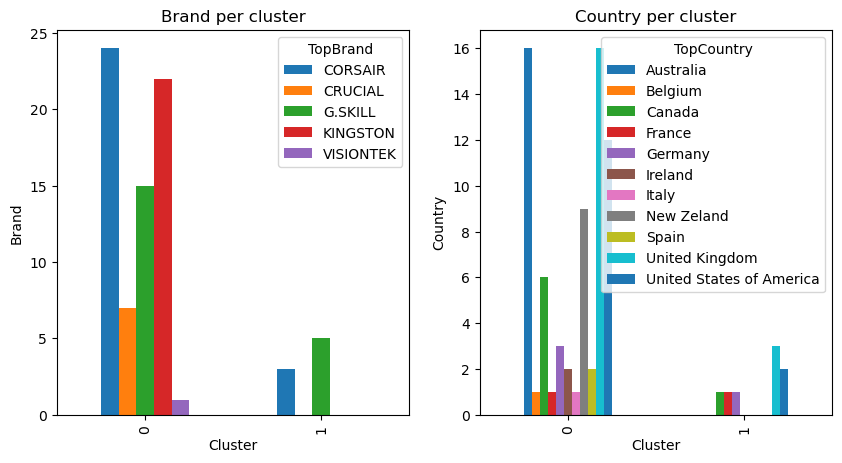

In [42]:
brand_xt_pct = pd.crosstab(kmeans_pca_final.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(kmeans_pca_final.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

## Prototype-based evaluation

### K-means vs X-means

Current number of clusters: 2
Number of points per cluster label: {0: 7, 1: 70}
Number of singleton clusters: 0
Current number of clusters: 2
Number of points per cluster label: {0: 70, 1: 7}
Number of singleton clusters: 0
Silhouette score: 0.40282372906547503
Silhouette score: 0.40282372906547503


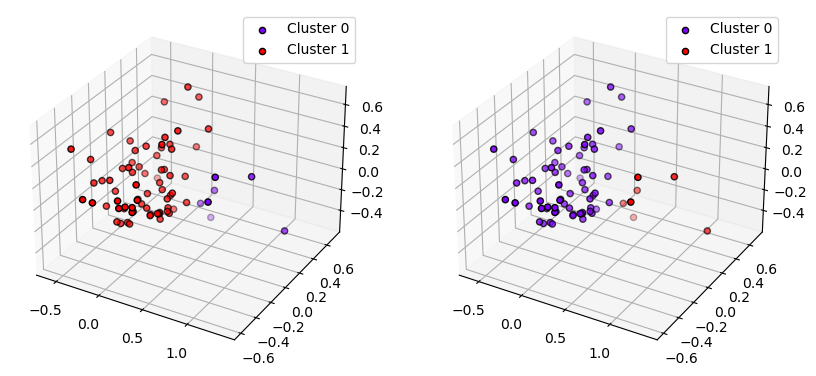

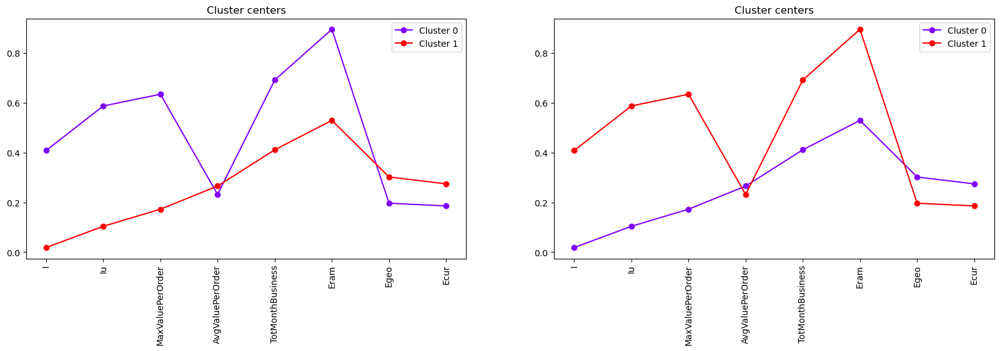

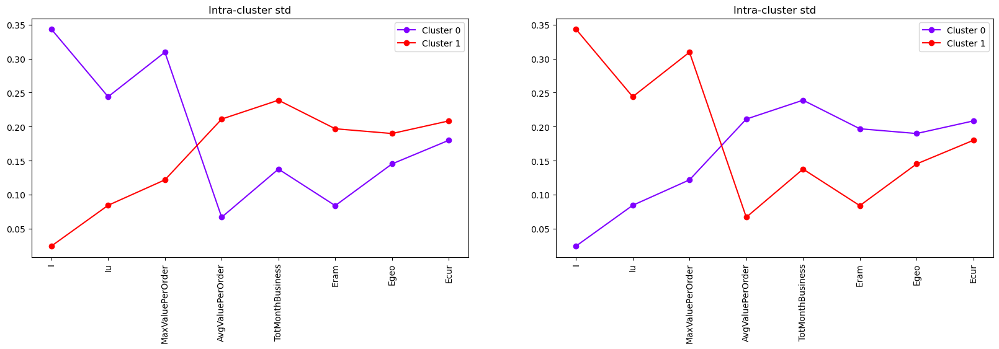

In [188]:
visualise_model_characteristics([vendor_norm, vendor_norm], [kmeans_res, xmeans_res])

#### Conclusion  
The differences in the clustering do not seem significant, since we preferred the Ward versions for both K-means and X-means this is to be expected.  
The obtained clustering seems reasonable visually considering the PCA plot and the scale of the axis, particularly in the versions without outliers since the axis altered significantly both in terms of direction and variance in the distribution of the points.  

In the situation with outliers the dominant feature in helping us identify the clusters is the line that splits the dataset in two.  
In the situation without outliers the line loses relevance since the points are more evenly distributed between the dimensions, we therefore looked for parameters that split the points in spatially distinct globular clusters keeping in mind the changes in the considered metrics.

There also seems to be no point in performing the analysis on the dataset after having applied PCA given that both prototype methods attempt to minimise the variance.

In [43]:
ext_ind_kmeans_pca=pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], kmeans_pca_final.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], kmeans_pca_final.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], kmeans_pca_final.labels_, average_method='arithmetic'))

ext_ind_kmeans_pca['Feature'] = temp
ext_ind_kmeans_pca['Homogeneity'] = hom
ext_ind_kmeans_pca['Completeness'] = compl
ext_ind_kmeans_pca['Mutual Info'] = mutinfo
ext_ind_kmeans_pca

,Feature,Homogeneity,Completeness,Mutual Information
0,TopBrand,0.048284,0.195411,0.077435
1,TopCountry,0.033409,0.200473,0.057273


## Task 2.2: Density-based clustering

### X-means methodology  
Where X-means results, starting from a single cluster, were not satisfactory we increased the number of starting points until a good result was reached.  
The goodness of the result was measured through the use of the plotted metrics and the 3d visualisation.

### X-means

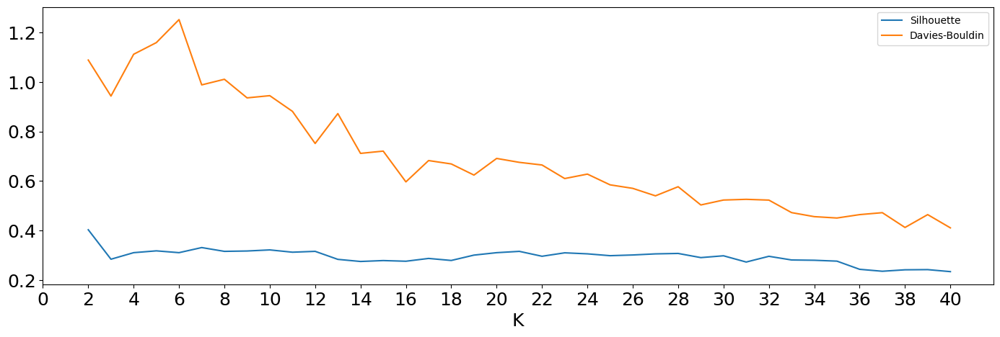

In [182]:
plot_metrics_per_k(vendor_norm, ["sil", "db"], model_sk=xmeans_sk(n_clusters=1, n_init=10))

Current number of clusters: 2
Number of points per cluster label: {0: 70, 1: 7}
Number of singleton clusters: 0
Silhouette score: 0.40282372906547503


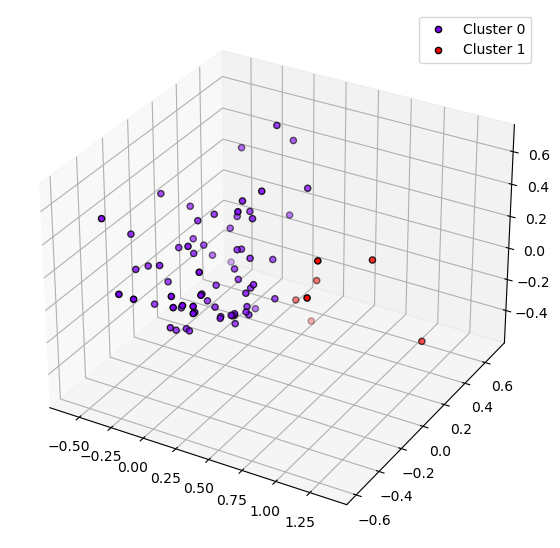

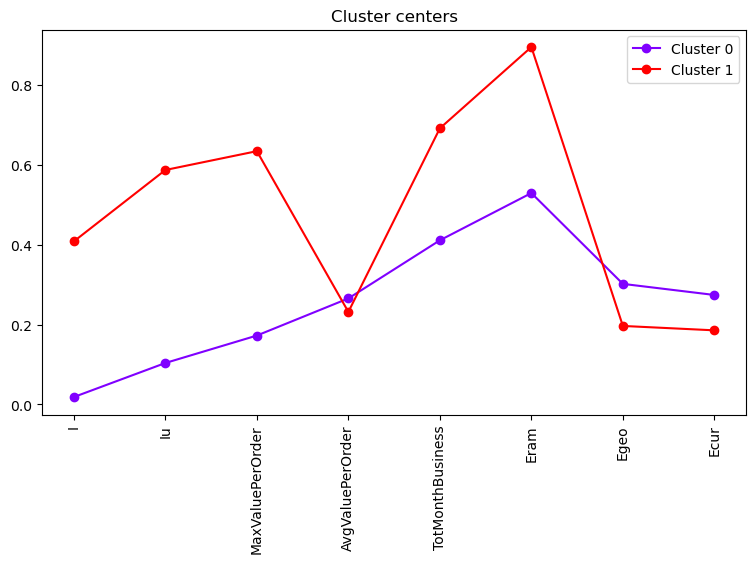

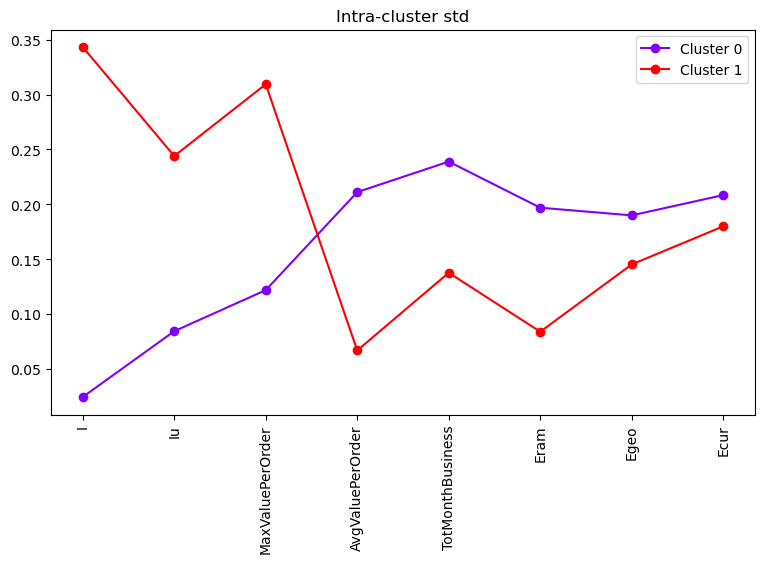

In [184]:
xmeans_res = xmeans_sk(n_clusters=2, n_init=20).fit(vendor_norm)

visualise_model_characteristics([vendor_norm], [xmeans_res])

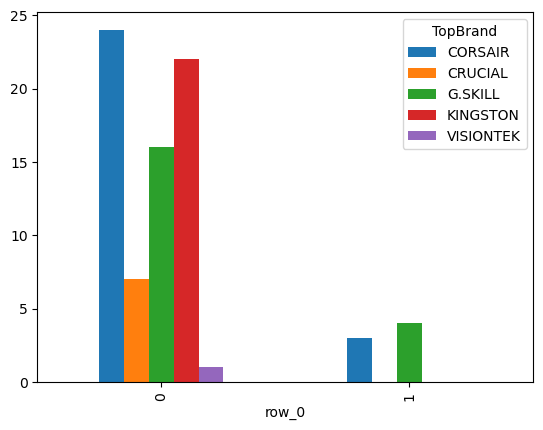

In [185]:
pd.crosstab(xmeans_res.labels_,vendor_df_cat['TopBrand']).plot(kind="bar")
plt.show()

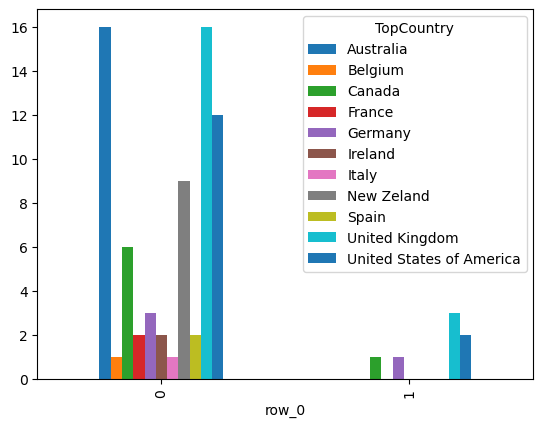

In [186]:
pd.crosstab(xmeans_res.labels_,vendor_df_cat['TopCountry']).plot(kind="bar")
plt.show()

### Determine optimal eps and minSamples

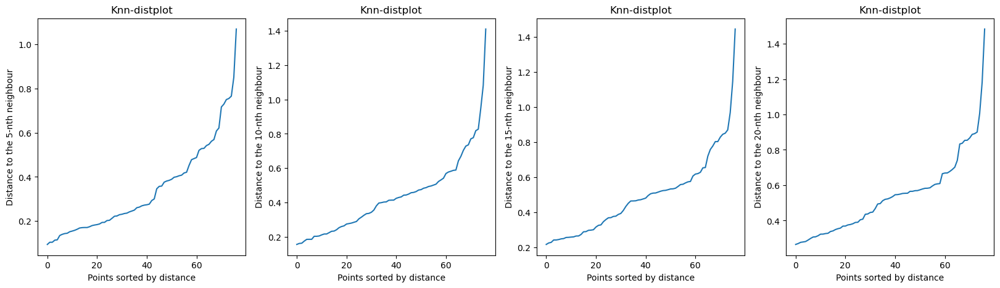

In [44]:
#Non-PCA
n_neigh = [5, 10, 15, 20]
plot_knn_dist([5, 10, 15, 20], [vendor_norm]*len(n_neigh))

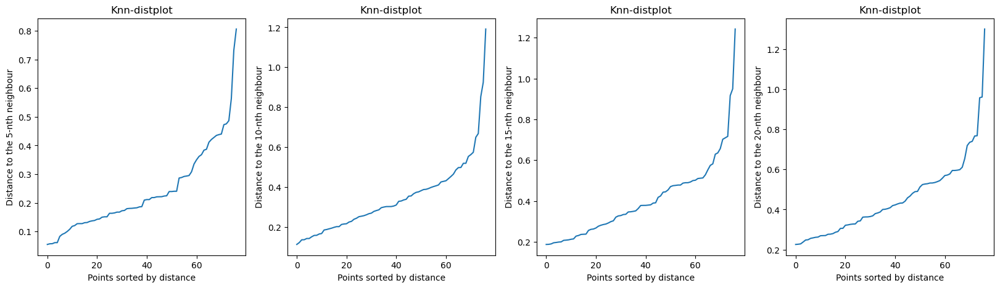

In [45]:
#PCA
n_neigh = [5, 10, 15, 20]
plot_knn_dist([5, 10, 15, 20], [vendor_pca]*len(n_neigh))

The KNN distance plot and the knee method didn't provide a clear solution for the preferred value of minSampes, the optimal value of eps seems to be included in [0.4, 0.6].  
There is also not much of a difference in the range of suggested values for the reduced (PCA) dataset.

### DBSCAN

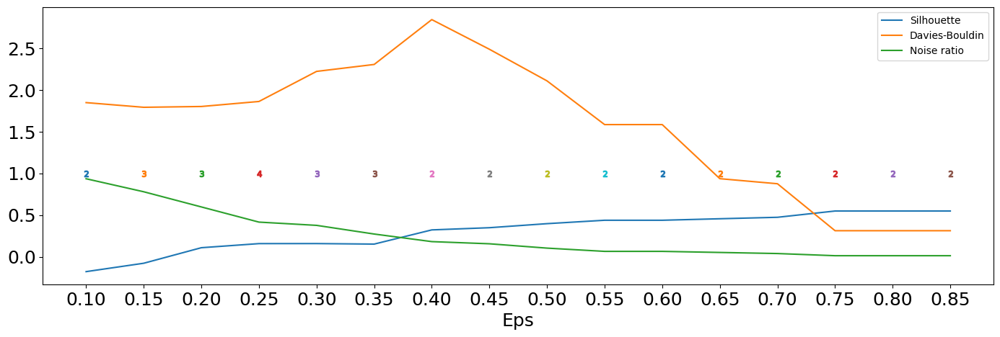

In [52]:
plot_metrics_per_eps(vendor_norm, ["sil", "db", "noise_ratio", "clusters"], precision=0.05, model_sk=DBSCAN(min_samples = 5, eps = 1))

Apart from the usual metrics we also introduced a simple ratio of noise datapoints to non-noise ones and the number of clusters per eps change, just to get an idea of the behaviour of the DBSCAN algorithm.

Clustering number 0
Number of clusters: 3
Number of points per cluster label: {-1: 46, 0: 24, 1: 7}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {-1: 29, 0: 40, 1: 8}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 2
Number of points per cluster label: {-1: 14, 0: 63}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 2
Number of points per cluster label: {-1: 8, 0: 69}
Number of singleton clusters: 0




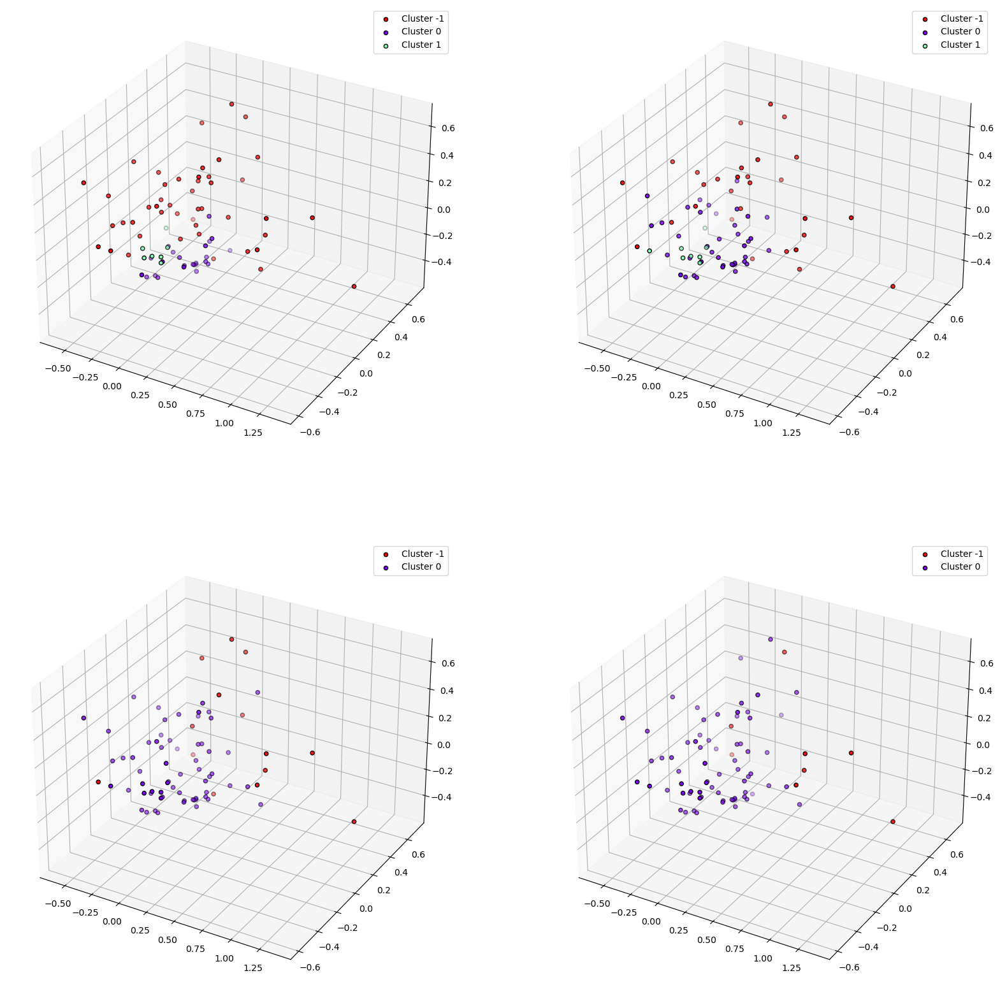

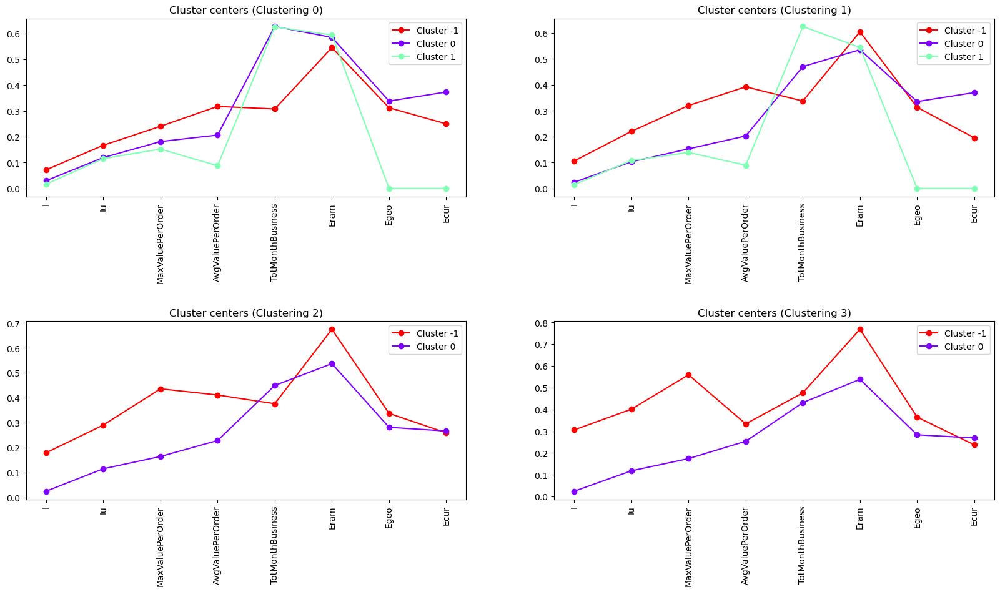

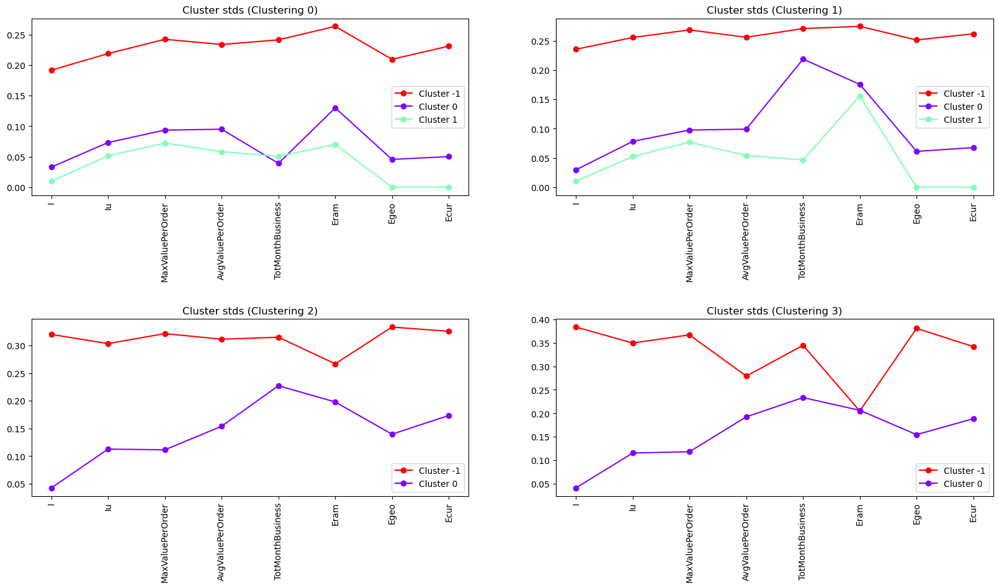

In [51]:
dbscan_res = []

for i in np.arange(0.2, 0.6, 0.1):
    dbscan_res.append(DBSCAN(min_samples = 5, eps = i).fit(vendor_norm))

visualise_model_characteristics([vendor_norm]*len(dbscan_res), dbscan_res)

We can note that:
- In the 1st clustering we again find a good characterisation of clusters 0/1 in the features I/Iu/MaxValuePerOrder which have both a low average and a low std in the clusters.  
- We have a strong distinction (with low std) between cluster 0 and 1 in the features Egeo/Ecur signaling that cluster 1 are vendors that sell in few places, probably locally and in their local currency.
- The noise cluster displays a higher value of I/Iu/MaxValuePerOrder compared to the others, however its std its quite high making this characterisation unfeasible in our opinion.  

From these informations we could generate the "small-local" and "small-international" vendor labels, however a big chunk of datapoints are stuck in the noise cluster which doesn't have any distinguishing features given that it is an average of the majority of the data points.

The other clusterings are less interesting to consider given the low amount of clusters and the fact that the vast majority of points are concentrated in a single cluster.

In [59]:
dbscan_final = dbscan_res[0]

### External indices

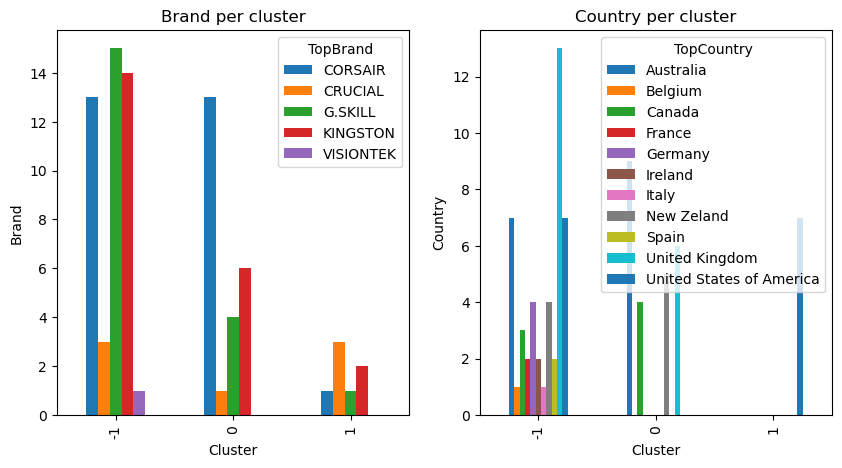

In [60]:
brand_xt_pct = pd.crosstab(dbscan_final.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(dbscan_final.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

In [62]:
ext_ind_dbscan = pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], dbscan_final.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], dbscan_final.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], dbscan_final.labels_, average_method='arithmetic'))

ext_ind_dbscan['Feature'] = temp
ext_ind_dbscan['Homogeneity'] = hom
ext_ind_dbscan['Completeness'] = compl
ext_ind_dbscan['Mutual Info'] = mutinfo
ext_ind_dbscan

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.062188,0.094423,0.074988
1,TopCountry,0.162077,0.364870,0.224452


### DBSCAN (PCA)

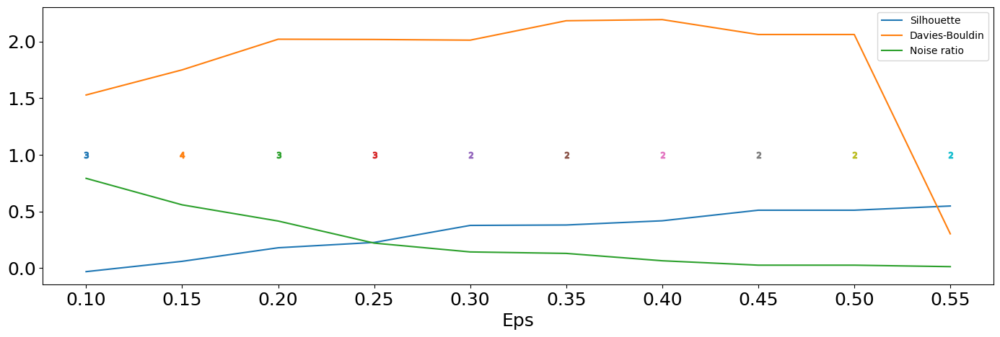

In [55]:
plot_metrics_per_eps(vendor_pca, ["sil", "db", "noise_ratio", "clusters"], precision=0.05, model_sk=DBSCAN(min_samples = 5, eps = 1))

Clustering number 0
Number of clusters: 4
Number of points per cluster label: {-1: 43, 0: 23, 1: 7, 2: 4}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {-1: 17, 0: 52, 1: 8}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 2
Number of points per cluster label: {-1: 10, 0: 67}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 2
Number of points per cluster label: {-1: 2, 0: 75}
Number of singleton clusters: 0




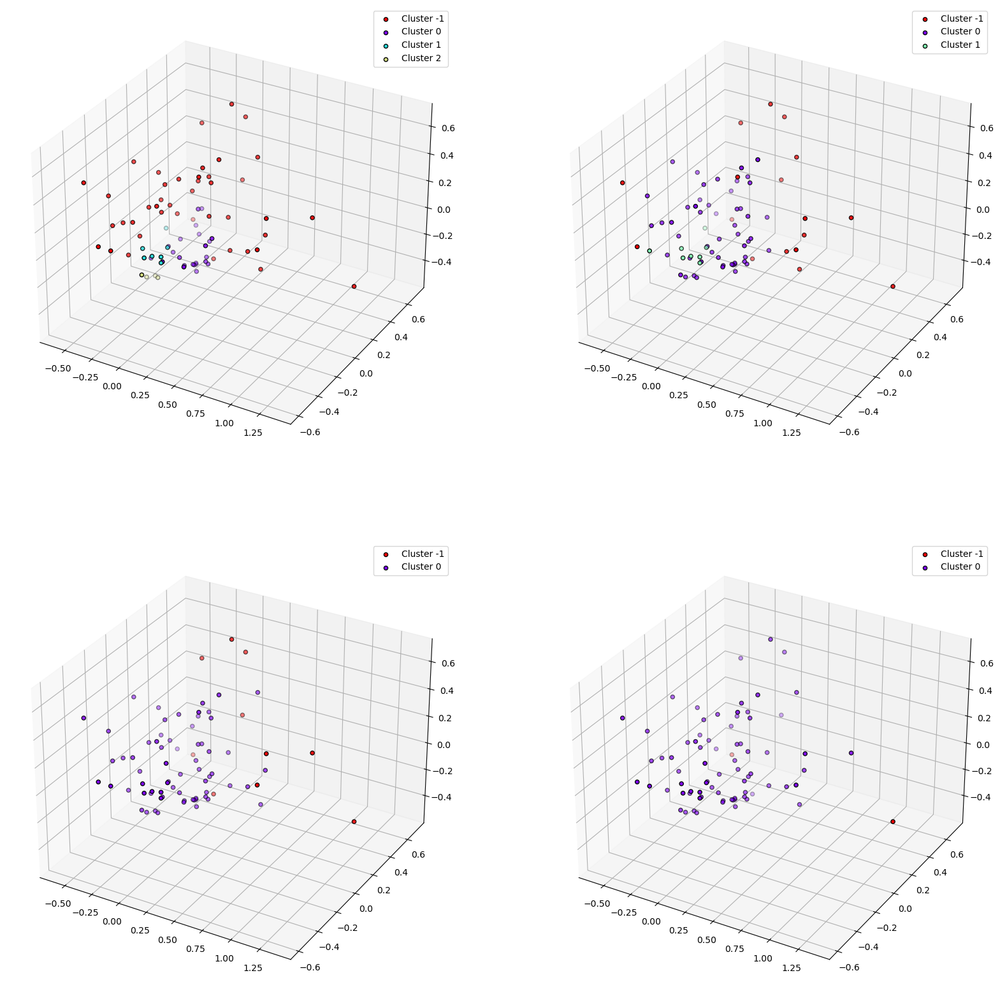

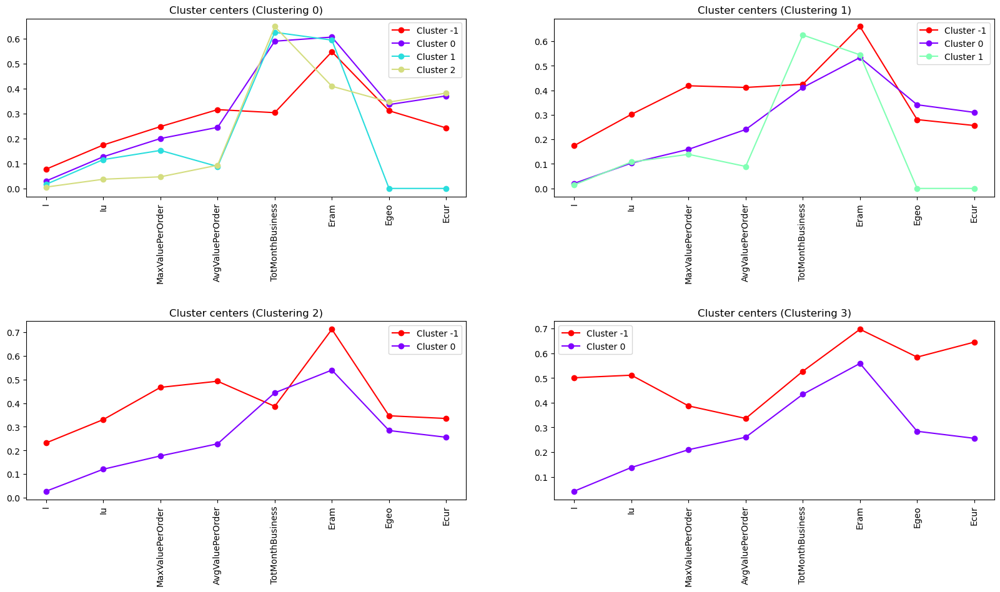

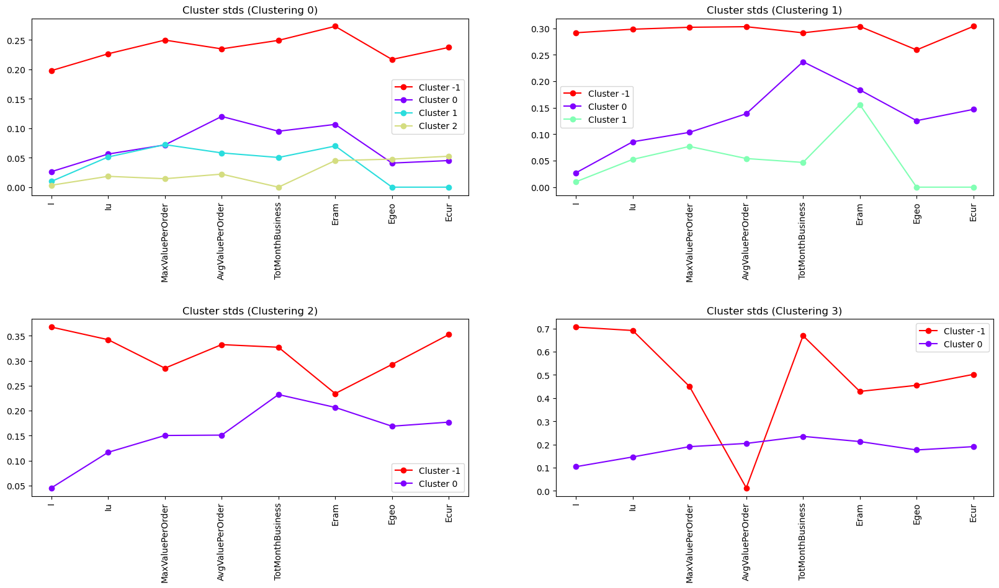

In [58]:
dbscan_pca_res = []

for i in np.arange(0.15, 0.55, 0.1):
    dbscan_pca_res.append(DBSCAN(min_samples = 5, eps = i).fit(vendor_pca))

visualise_model_characteristics([vendor_norm]*len(dbscan_res), dbscan_pca_res)

The above considerations also apply to these results.

In [63]:
dbscan_final_pca = dbscan_pca_res[0]

### External indices

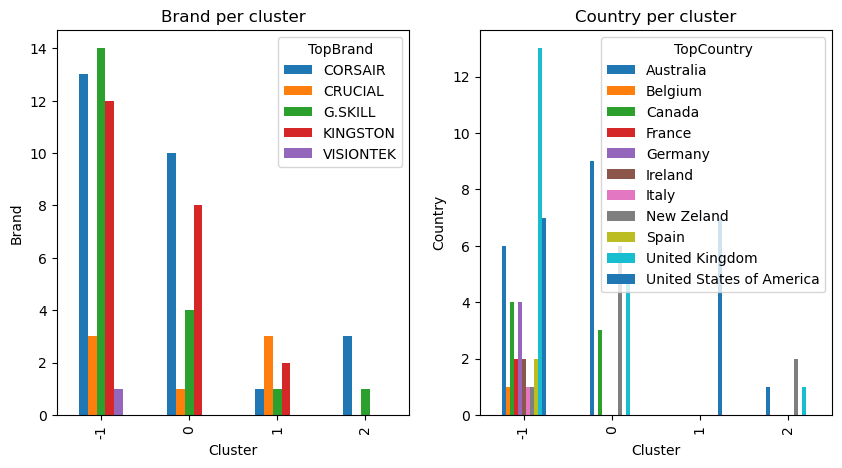

In [65]:
brand_xt_pct = pd.crosstab(dbscan_final_pca.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(dbscan_final_pca.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

In [66]:
ext_ind_dbscan_pca = pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], dbscan_final_pca.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], dbscan_final_pca.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], dbscan_final_pca.labels_, average_method='arithmetic'))

ext_ind_dbscan_pca['Feature'] = temp
ext_ind_dbscan_pca['Homogeneity'] = hom
ext_ind_dbscan_pca['Completeness'] = compl
ext_ind_dbscan_pca['Mutual Info'] = mutinfo
ext_ind_dbscan_pca

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.072367,0.092346,0.081145
1,TopCountry,0.200800,0.379914,0.262734


### DBSCAN evaluation  

#### Non-PCA vs PCA

Clustering number 0
Number of clusters: 3
Number of points per cluster label: {-1: 46, 0: 24, 1: 7}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 4
Number of points per cluster label: {-1: 43, 0: 23, 1: 7, 2: 4}
Number of singleton clusters: 0




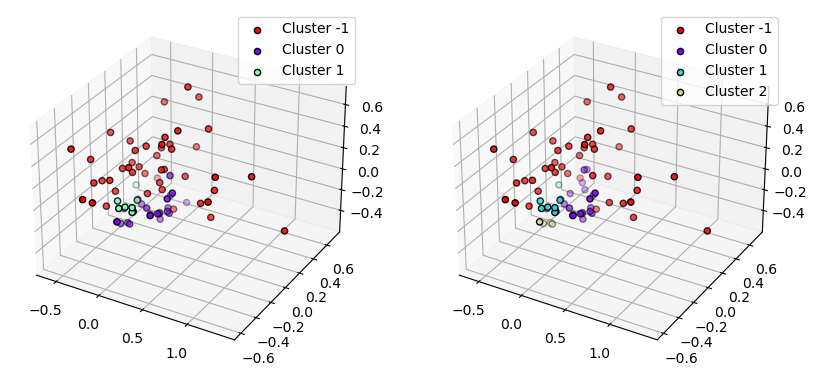

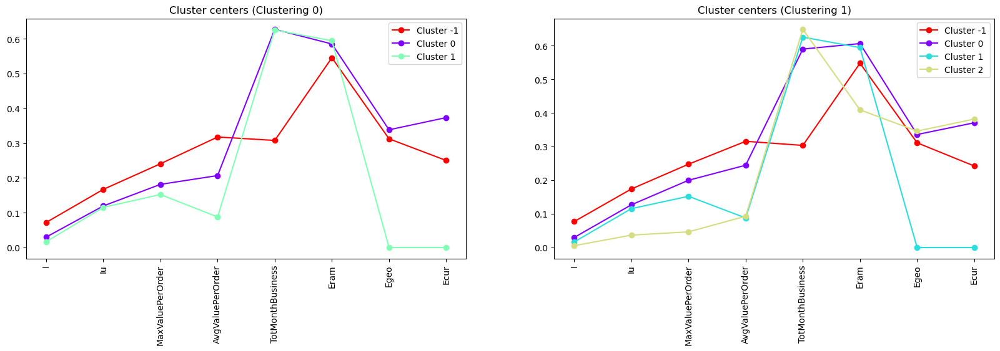

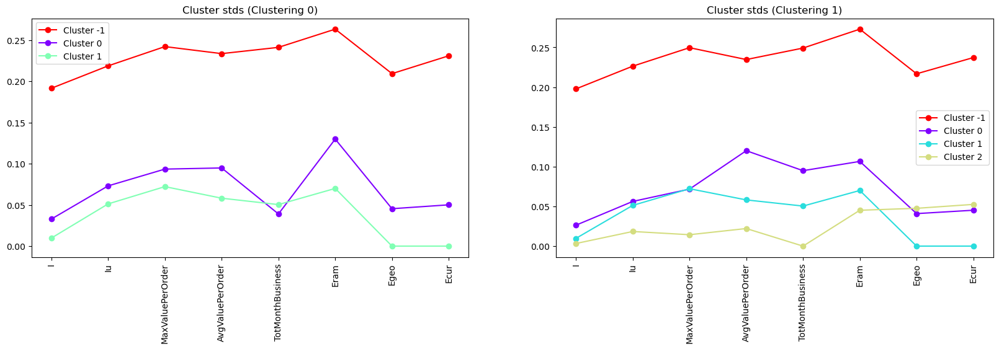

In [68]:
visualise_model_characteristics([vendor_norm, vendor_norm], [dbscan_final, dbscan_final_pca])

In [70]:
ext_ind_dbscan

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.062188,0.094423,0.074988
1,TopCountry,0.162077,0.364870,0.224452


In [69]:
ext_ind_dbscan_pca

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.072367,0.092346,0.081145
1,TopCountry,0.200800,0.379914,0.262734


### Conclusion  
DBSCAN clusterings aren't too promising, probably due to the different densities of the clusters, however we managed to find another way to cluster a subset of the datapoints depending on the "internationality" of the vendor.  
Due to the limited coverage of these clusters labels we still prefer the results obtained from KMeans.  
Using PCA in this situation didn't noticeably change the results.

## Task 2.3: Hierarchical clustering (Agglomerative)

### Single linkage

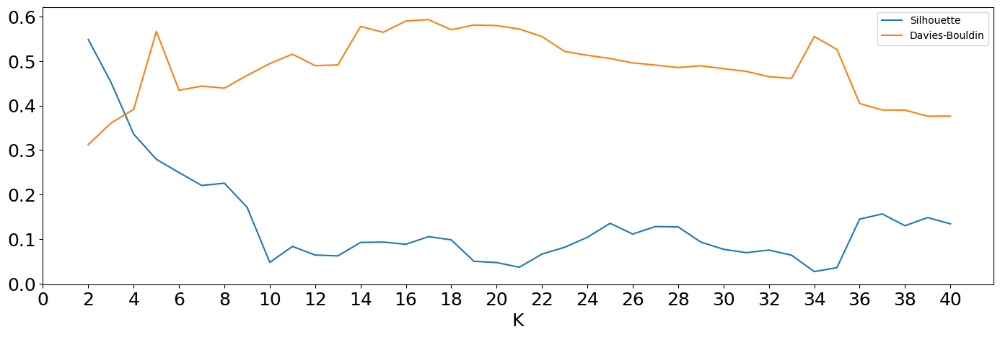

In [206]:
plot_metrics_per_k(vendor_norm, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="single"))

Cophenetic coefficient: 0.8157740135680032


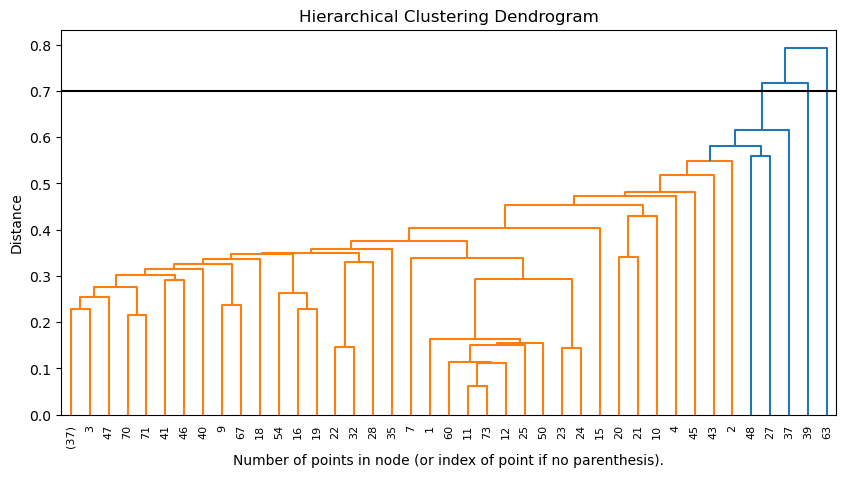

Clustering number 0
Number of clusters: 3
Number of points per cluster label: {0: 75, 1: 1, 2: 1}
Number of singleton clusters: 2




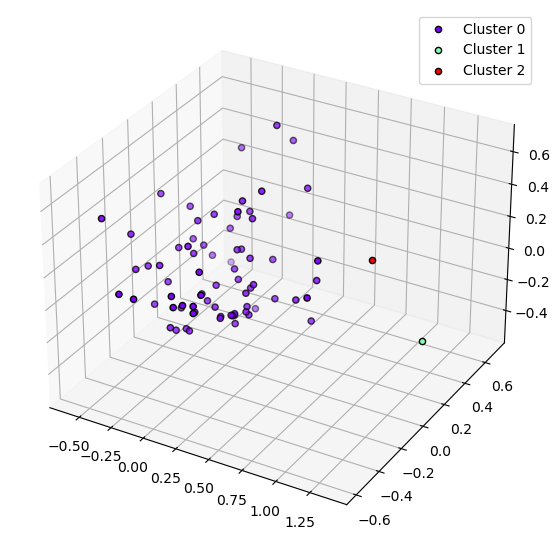

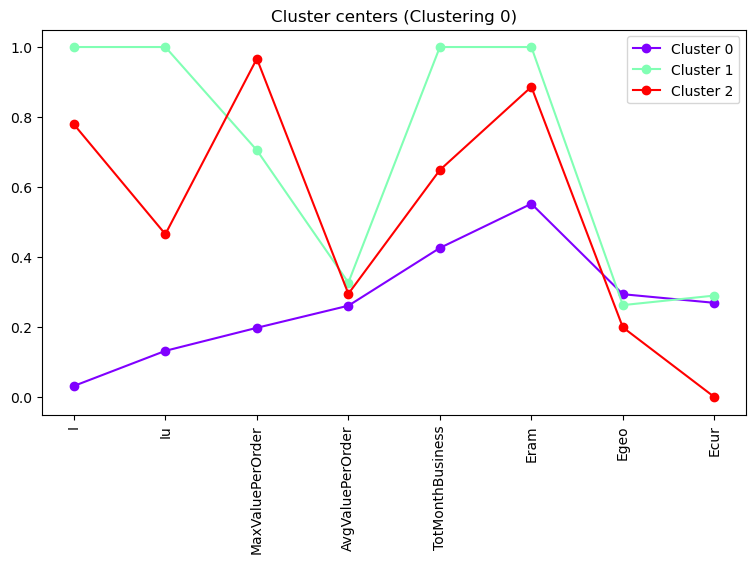

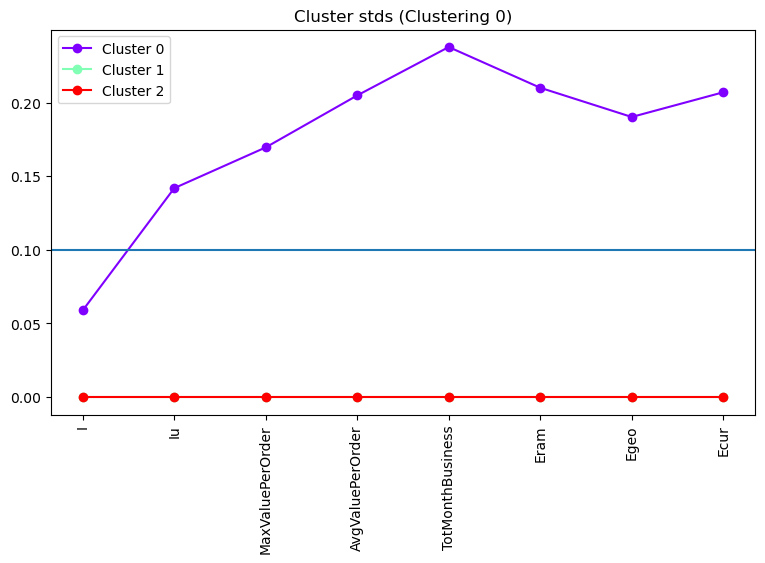

In [114]:
max_d = 0.7

hier_clustering_single_res = AgglomerativeClustering(distance_threshold=max_d, n_clusters=None, linkage="single").fit(vendor_norm)

Z = linkage(vendor_norm, 'single')
c, coph_dists = cophenet(Z, pdist(vendor_norm))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_single_res, [max_d], truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm], [hier_clustering_single_res])

### External indices

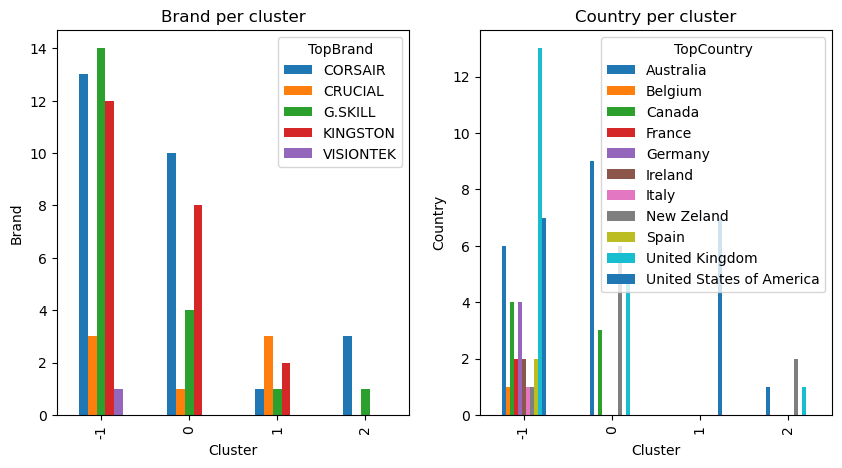

In [65]:
brand_xt_pct = pd.crosstab(dbscan_final_pca.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(dbscan_final_pca.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

In [66]:
ext_ind_dbscan_pca = pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], dbscan_final_pca.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], dbscan_final_pca.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], dbscan_final_pca.labels_, average_method='arithmetic'))

ext_ind_dbscan_pca['Feature'] = temp
ext_ind_dbscan_pca['Homogeneity'] = hom
ext_ind_dbscan_pca['Completeness'] = compl
ext_ind_dbscan_pca['Mutual Info'] = mutinfo
ext_ind_dbscan_pca

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.072367,0.092346,0.081145
1,TopCountry,0.200800,0.379914,0.262734


### Single linkage (PCA)

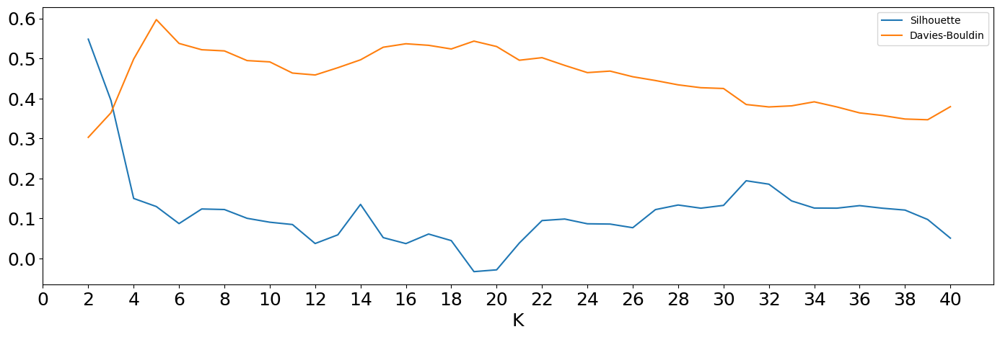

In [212]:
plot_metrics_per_k(vendor_pca, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="single"))

Cophenetic coefficient: 0.7807328782646124


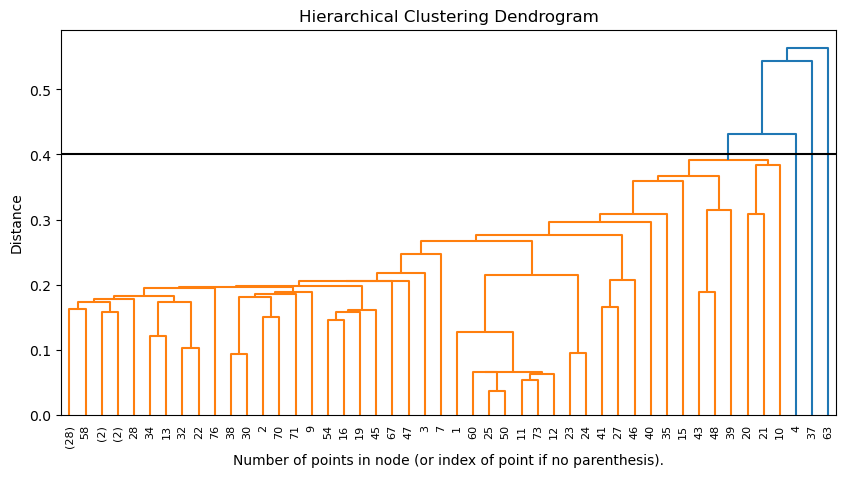

Clustering number 0
Number of clusters: 4
Number of points per cluster label: {0: 74, 1: 1, 2: 1, 3: 1}
Number of singleton clusters: 3




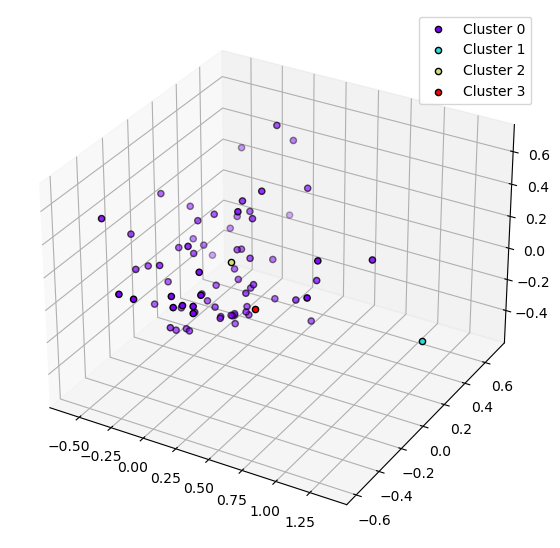

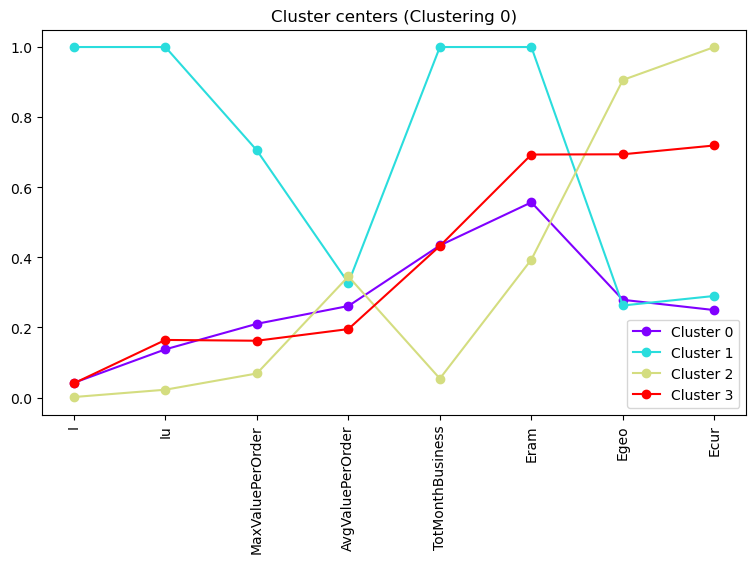

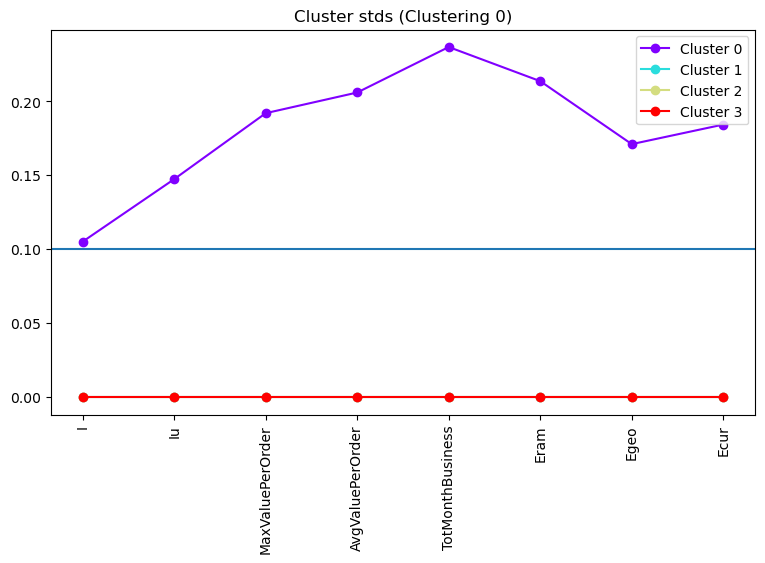

In [115]:
max_d = 0.4

hier_clustering_single_pca_res = AgglomerativeClustering(distance_threshold=max_d, n_clusters=None, linkage="single").fit(vendor_pca)

Z = linkage(vendor_pca, 'single')
c, coph_dists = cophenet(Z, pdist(vendor_pca))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_single_pca_res, [max_d], truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm], [hier_clustering_single_pca_res])

### Conclusion  
The results for the single linkage are terrible, we can see from the dendogram that the majority of the clusters, especially the top level ones, are formed by agglomerating a big cluster and a single points.  
Wherever we choose to cut we will have a very big clusters and some smaller ones.
This makes this method unfeasible for our dataset.

### Complete linkage

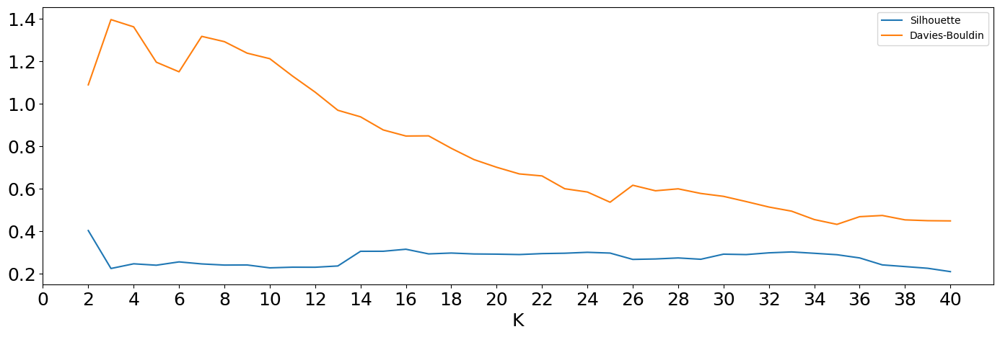

In [102]:
plot_metrics_per_k(vendor_norm, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="complete"))

Cophenetic coefficient: 0.7218050831610338


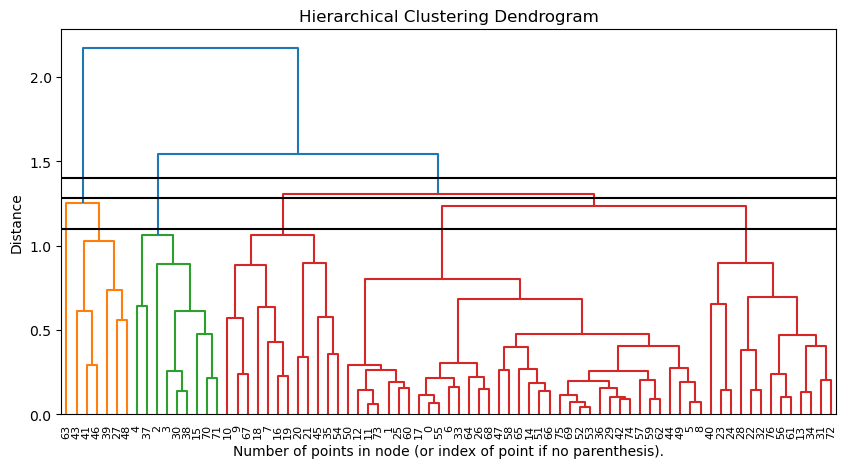

Clustering number 0
Number of clusters: 3
Number of points per cluster label: {0: 61, 1: 7, 2: 9}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 4
Number of points per cluster label: {0: 7, 1: 49, 2: 9, 3: 12}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 6
Number of points per cluster label: {0: 12, 1: 6, 2: 9, 3: 13, 4: 1, 5: 36}
Number of singleton clusters: 1




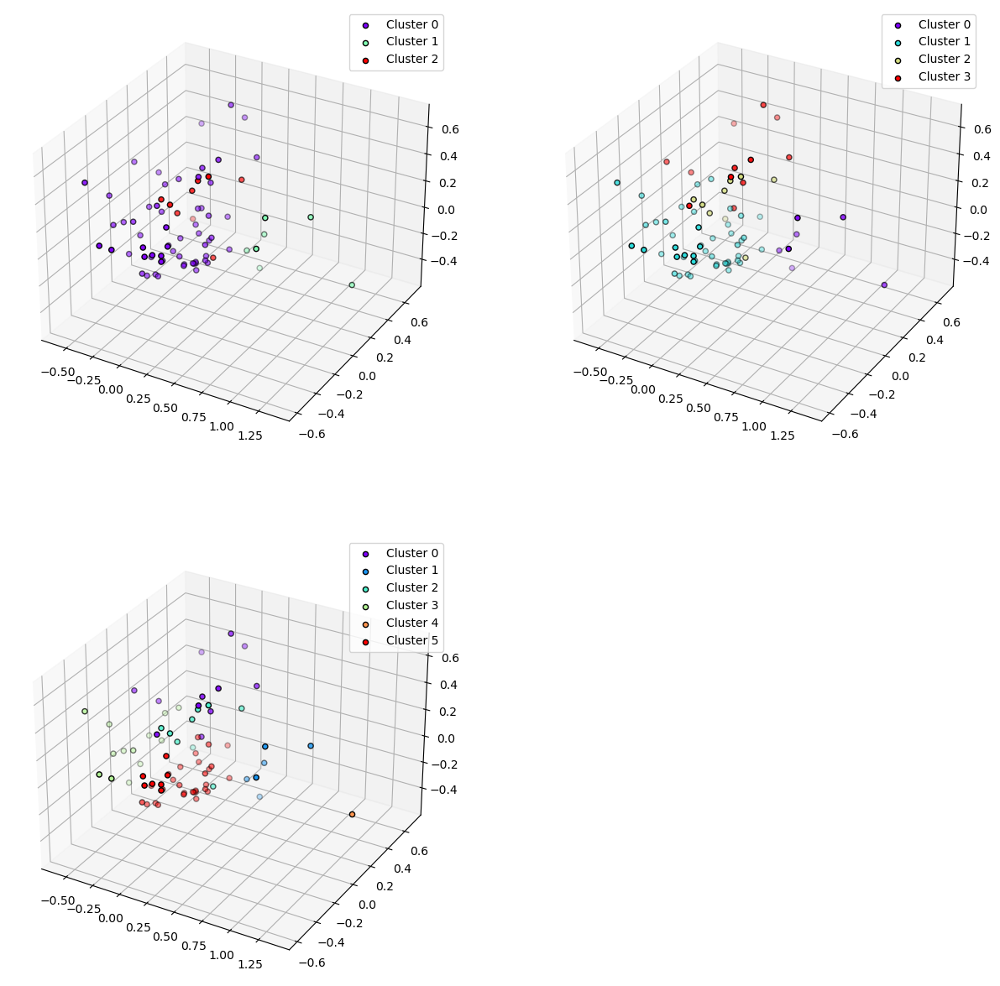

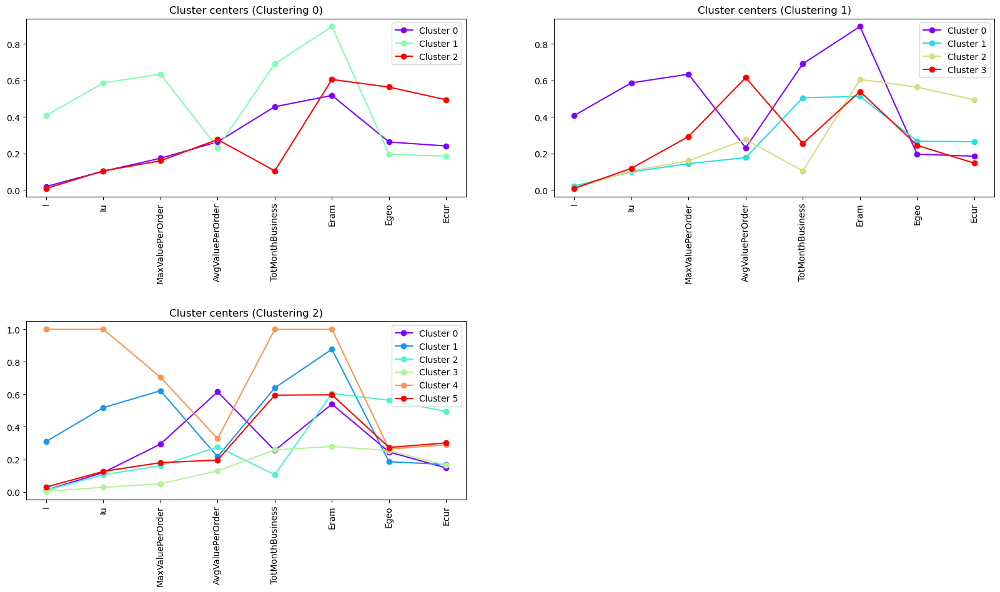

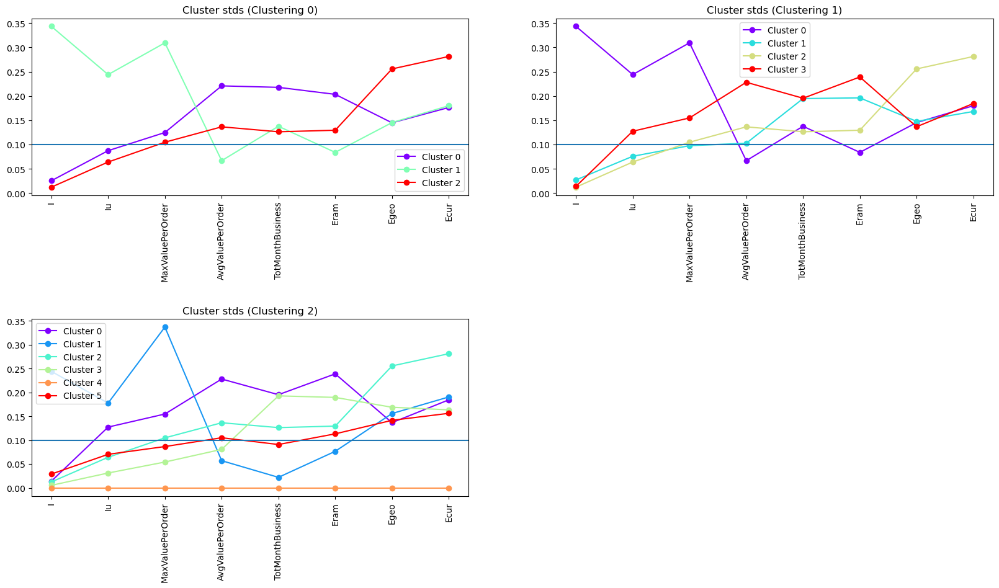

In [123]:
max_d = [1.4, 1.28, 1.1]

hier_clustering_complete_res = []

for i in max_d:
    hier_clustering_complete_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="complete").fit(vendor_norm))

Z = linkage(vendor_norm, 'complete')
c, coph_dists = cophenet(Z, pdist(vendor_norm))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_complete_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_complete_res), hier_clustering_complete_res)

In clustering 0, the distinguishing features are again low and consistent I/Iu/MaxValuePerOrder for clusters 0/2 and an higher value of Eram for cluster 1.  
As in K-means, the only sensible outcome is to assign the labels big/small vendors to these clusters, however we need to keep in mind that this is an approximation of the reality since, given the variance of cluster 1, it probably contains values I/Iu as low as those contained in the other clusters.  

Similar properties can also be seen in the other clusterings.

In [86]:
hier_clustering_complete_final = hier_clustering_complete_res[0]

### External indices

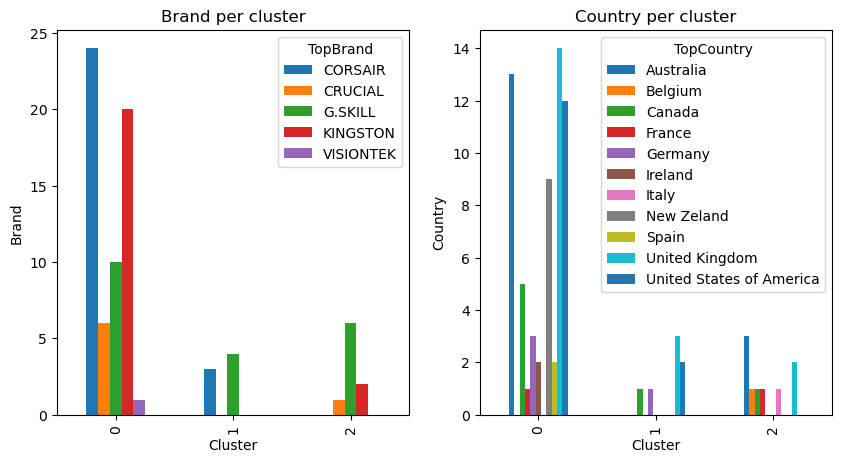

In [103]:
brand_xt_pct = pd.crosstab(hier_clustering_complete_final.labels_, vendor_df_cat['TopBrand'])
country_xt_pct = pd.crosstab(hier_clustering_complete_final.labels_, vendor_df_cat['TopCountry'])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

brand_xt_pct.plot(kind='bar', stacked=False, title='Brand per cluster', xlabel='Cluster', ylabel='Brand', ax=axes[0])

country_xt_pct.plot(kind='bar', stacked=False, title='Country per cluster', xlabel='Cluster', ylabel='Country', ax=axes[1])

plt.show()

In [102]:
ext_ind_hist_compl = pd.DataFrame()

temp = list()
hom = list()
compl = list()
mutinfo = list()

for column in vendor_df_cat:
    temp.append(column)
    hom.append(metrics.homogeneity_score(vendor_df_cat[column], hier_clustering_complete_final.labels_))
    compl.append(metrics.completeness_score(vendor_df_cat[column], hier_clustering_complete_final.labels_))
    mutinfo.append(metrics.normalized_mutual_info_score(vendor_df_cat[column], hier_clustering_complete_final.labels_, \
                                                        average_method='arithmetic'))

ext_ind_hist_compl['Feature'] = temp
ext_ind_hist_compl['Homogeneity'] = hom
ext_ind_hist_compl['Completeness'] = compl
ext_ind_hist_compl['Mutual Info'] = mutinfo
ext_ind_hist_compl

,Feature,Homogeneity,Completeness,Mutual Info
0,TopBrand,0.103216,0.213243,0.139103
1,TopCountry,0.086460,0.264845,0.130363


### Complete linkage (PCA)

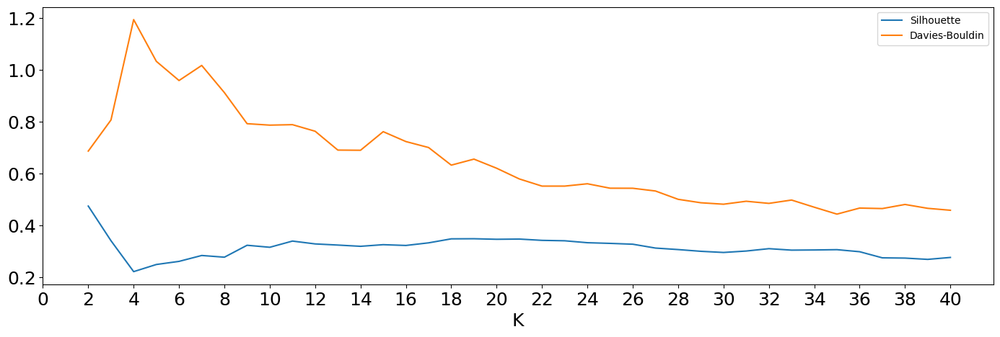

In [220]:
plot_metrics_per_k(vendor_pca, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="complete"))

Cophenetic coefficient: 0.7218050831610338


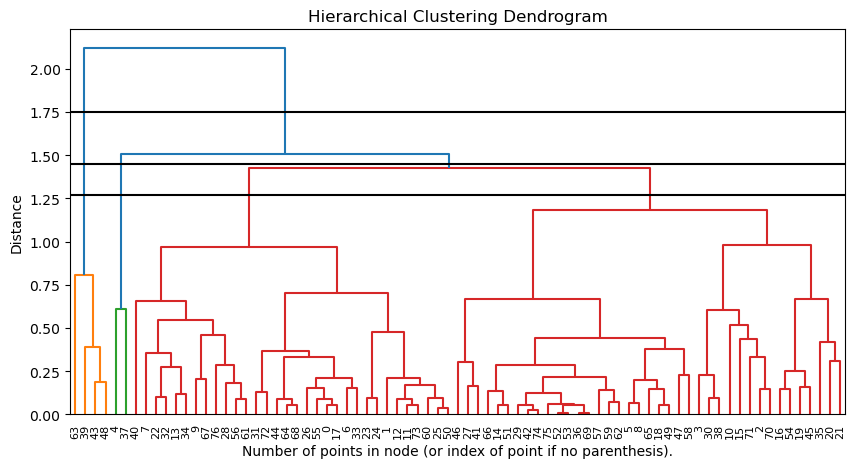

Clustering number 0
Number of clusters: 3
Number of points per cluster label: {0: 61, 1: 7, 2: 9}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 4
Number of points per cluster label: {0: 7, 1: 49, 2: 9, 3: 12}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 6
Number of points per cluster label: {0: 12, 1: 6, 2: 9, 3: 13, 4: 1, 5: 36}
Number of singleton clusters: 1




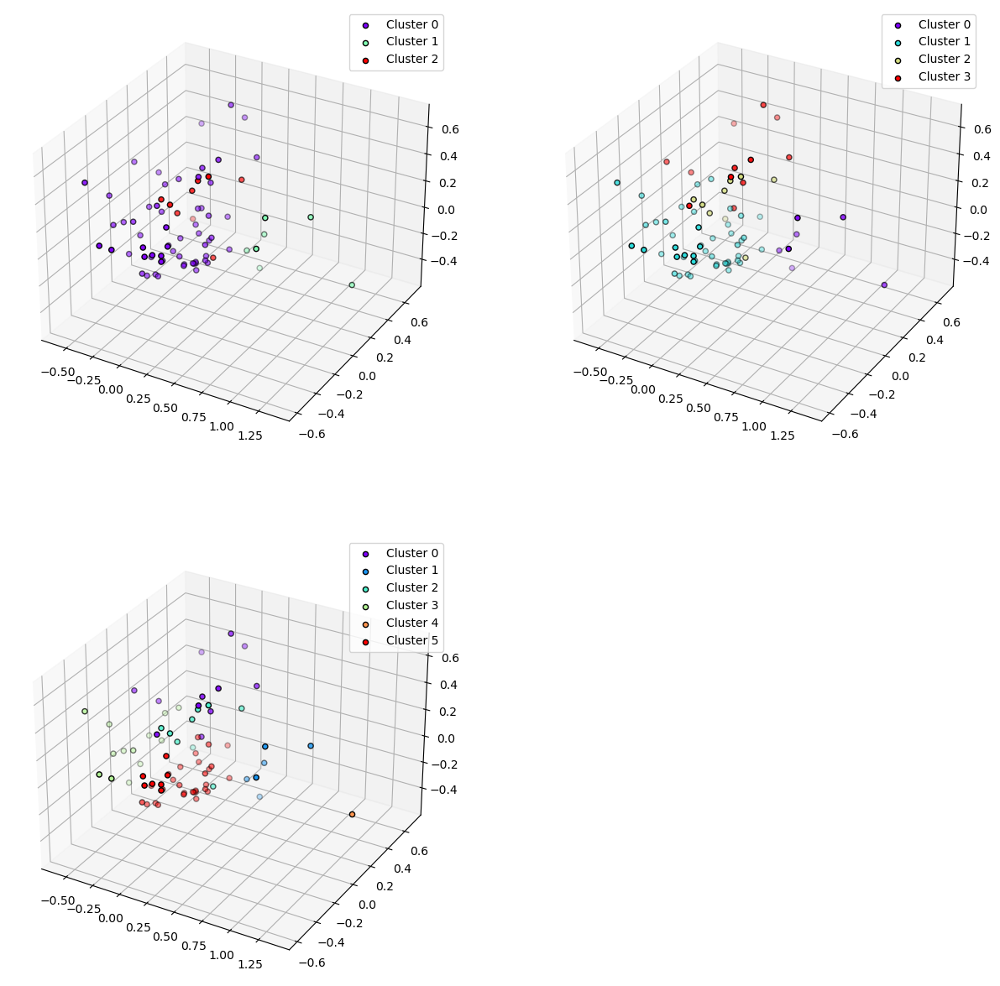

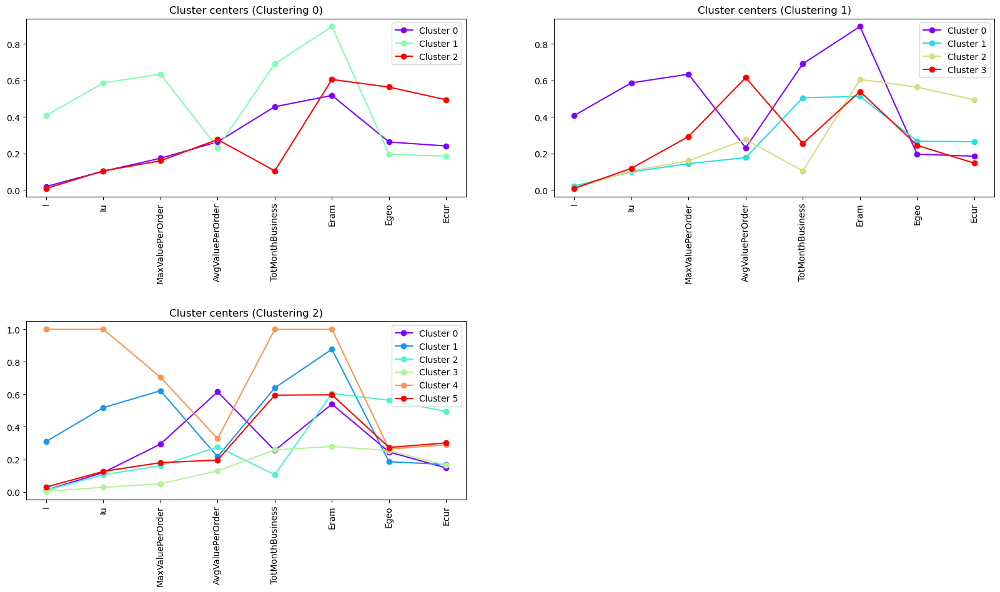

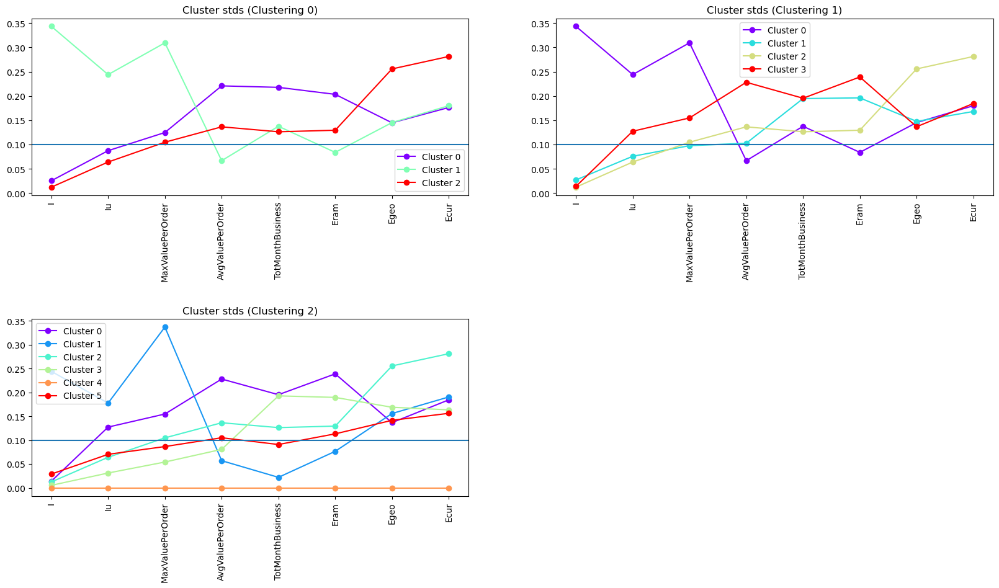

In [131]:
max_d = [1.75, 1.45, 1.27]

hier_clustering_complete_pca_res = []

for i in max_d:
    hier_clustering_complete_pca_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="complete").fit(vendor_pca))

Z = linkage(vendor_norm, 'complete')
c, coph_dists = cophenet(Z, pdist(vendor_norm))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_complete_pca_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_complete_res), hier_clustering_complete_res)

The same considerations as in the complete non-pca case apply.

#### Conclusion  
Using the Complete linkage were much more similar to what we found out with kmeans, further reinforcing the findings.  

### Average linkage

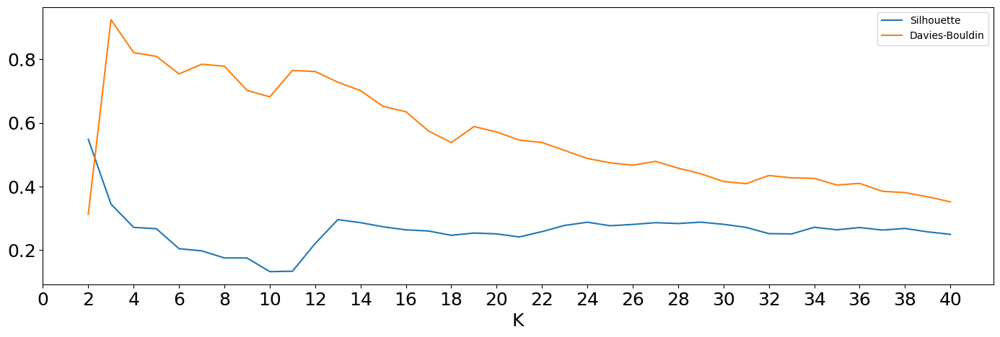

In [226]:
plot_metrics_per_k(vendor_norm, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="average"))

Cophenetic coefficient: 0.8360368567855508


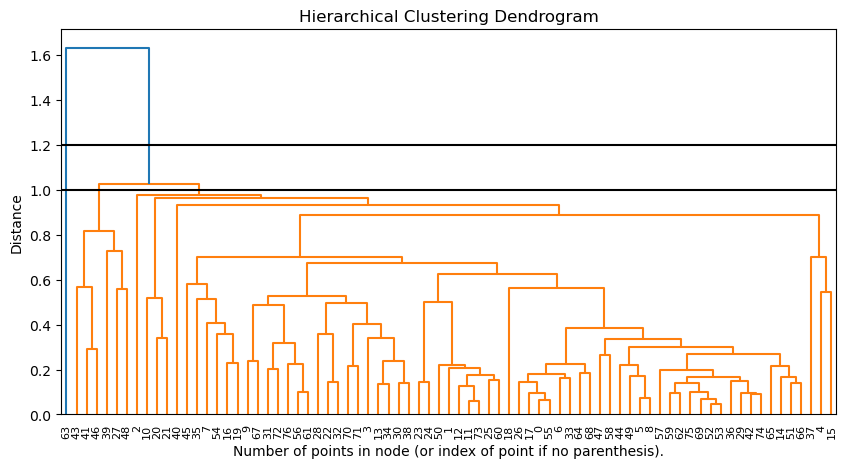

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 76, 1: 1}
Number of singleton clusters: 1


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 70, 1: 1, 2: 6}
Number of singleton clusters: 1




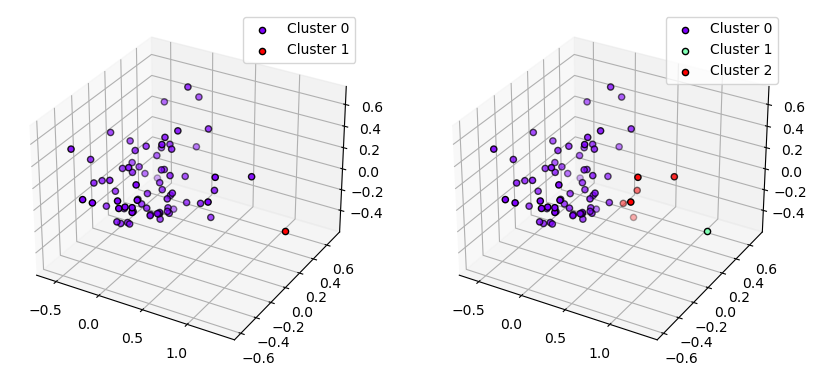

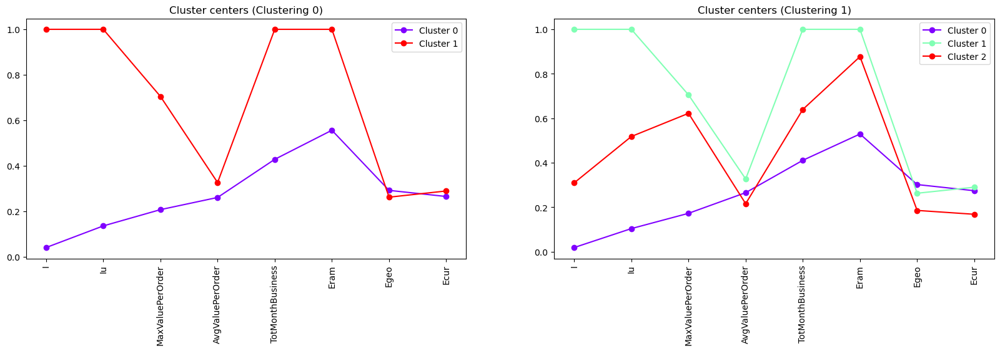

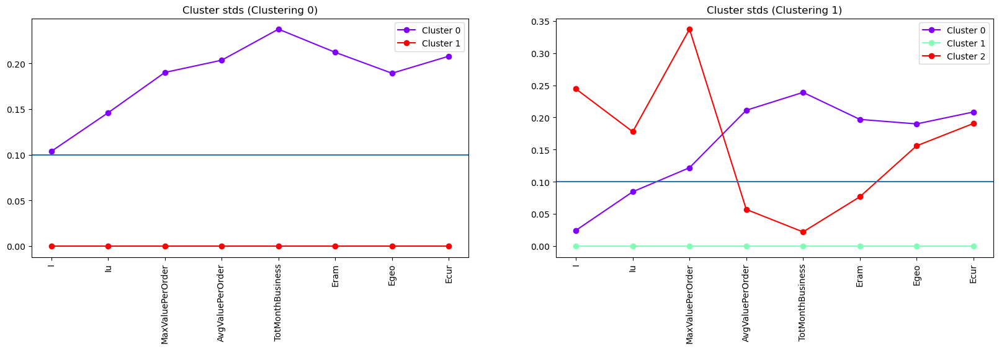

In [132]:
max_d = [1.2, 1]

hier_clustering_avg_res = []

for i in max_d:
    hier_clustering_avg_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="average").fit(vendor_norm))

Z = linkage(vendor_norm, 'average')
c, coph_dists = cophenet(Z, pdist(vendor_norm))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_avg_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_avg_res), hier_clustering_avg_res)

These clusterings suffer from a similar problem to the single linkage one.  
However in clustering 1, ignoring the single point cluster 1, we have a similar behaviour to K-means with all that it entails.

In [136]:
hier_clustering_average_final = hier_clustering_avg_res[1]

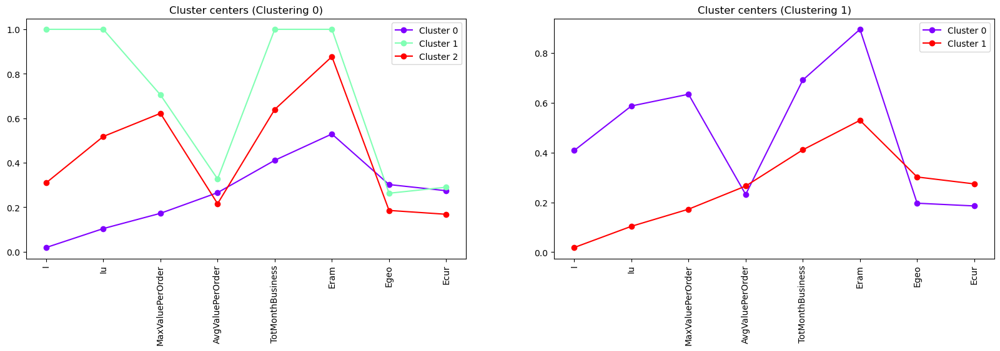

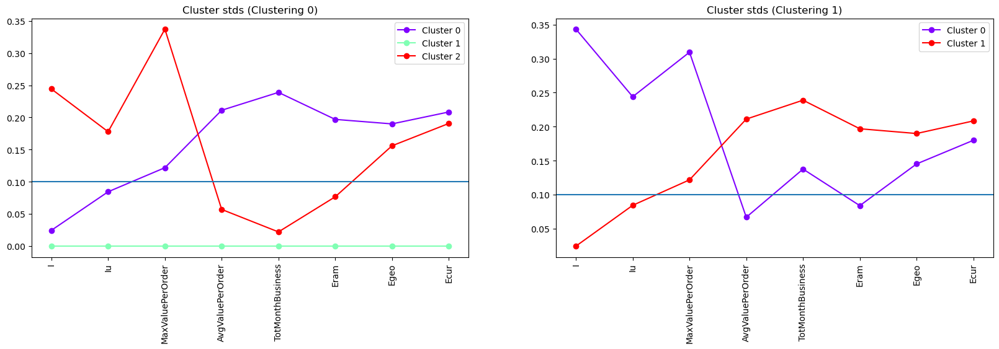

In [137]:
visualise_model_characteristics([vendor_norm, vendor_norm], [hier_clustering_average_final, kmeans_final], ["center", "std"])

### Average linkage (PCA)

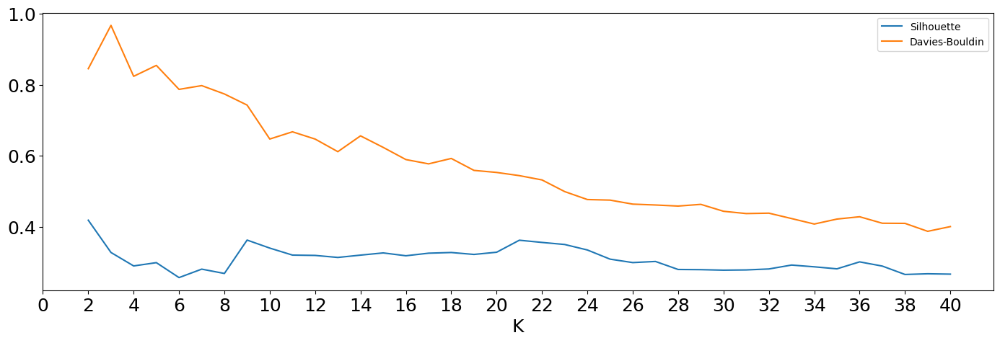

In [150]:
plot_metrics_per_k(vendor_pca, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="average"))

Cophenetic coefficient: 0.7463605162604013


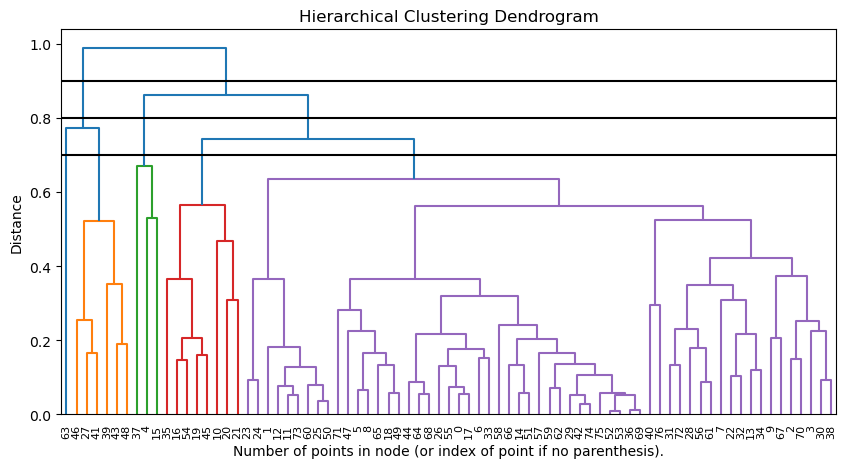

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 70, 1: 7}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 7, 1: 67, 2: 3}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 5
Number of points per cluster label: {0: 3, 1: 8, 2: 59, 3: 1, 4: 6}
Number of singleton clusters: 1




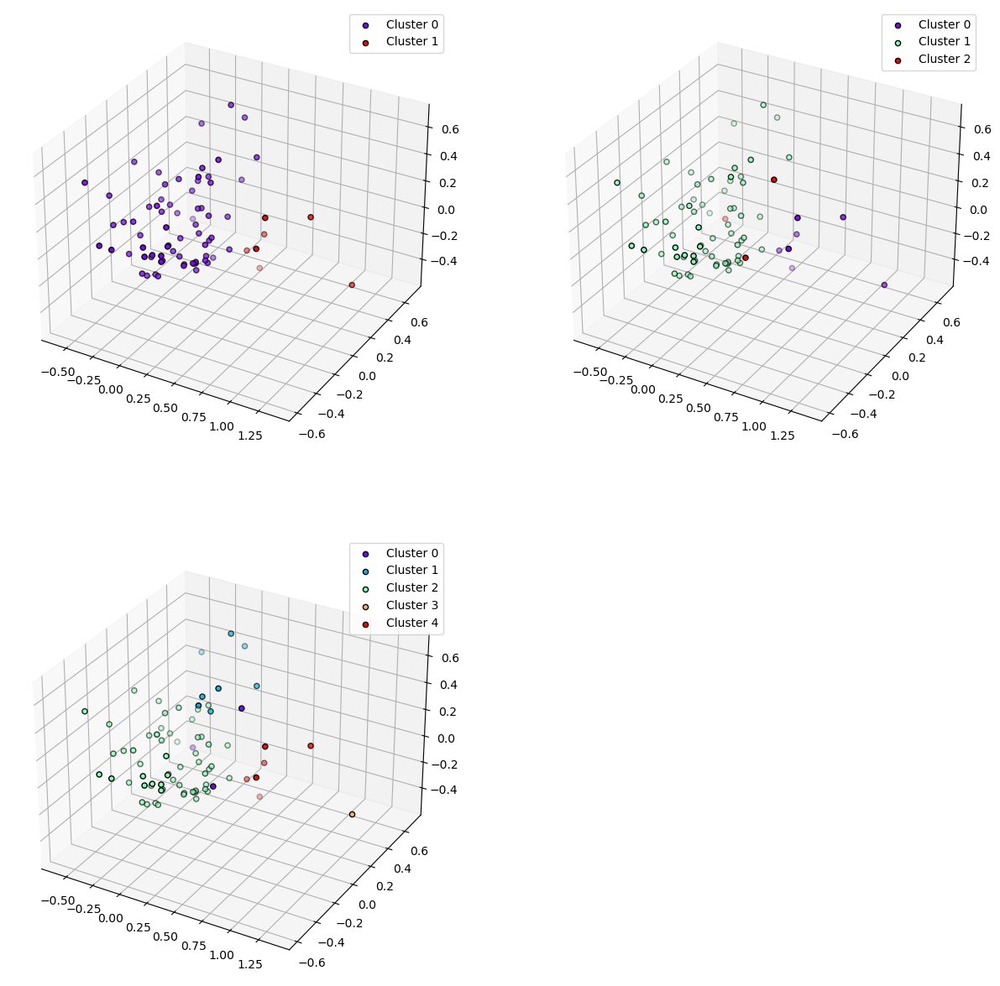

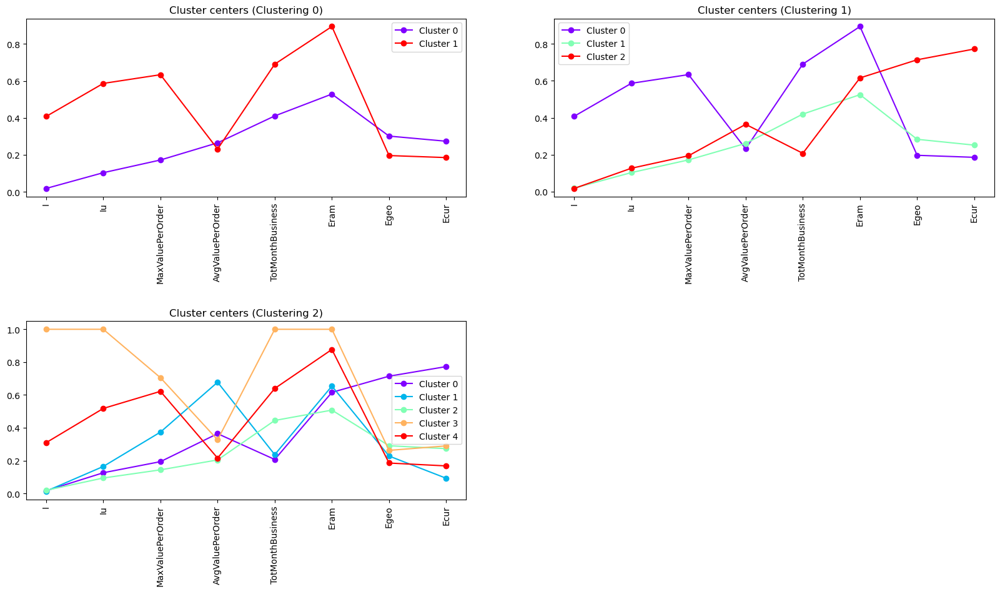

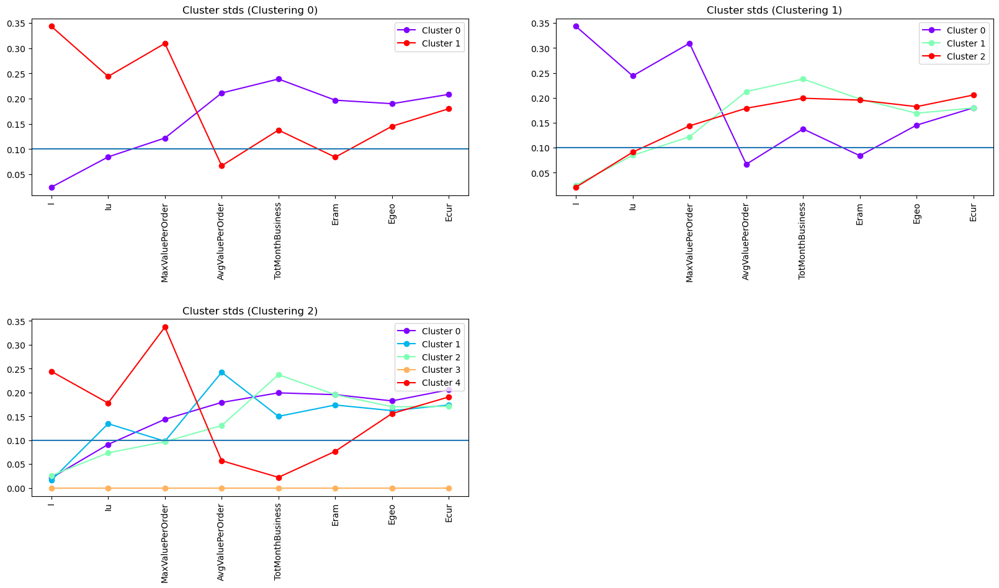

In [139]:
max_d = [0.9, 0.8, 0.7]

hier_clustering_avg_pca_res = []

for i in max_d:
    hier_clustering_avg_pca_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="average").fit(vendor_pca))

Z = linkage(vendor_pca, 'average')
c, coph_dists = cophenet(Z, pdist(vendor_pca))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_avg_pca_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_avg_pca_res), hier_clustering_avg_pca_res)

Again it shows an almost identical behaviour to K-means.

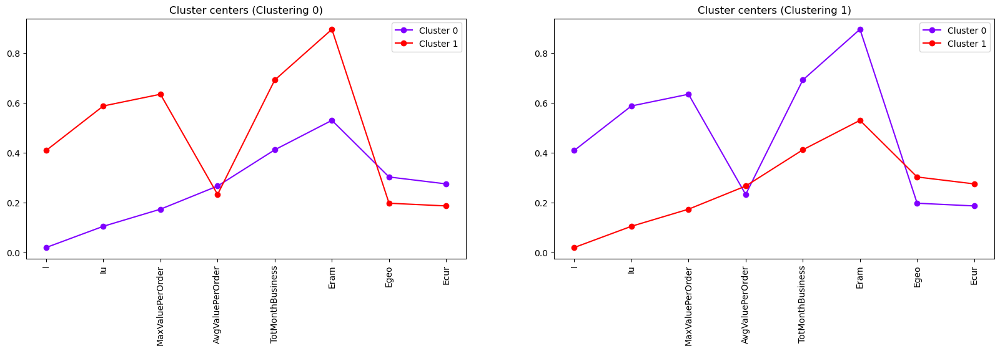

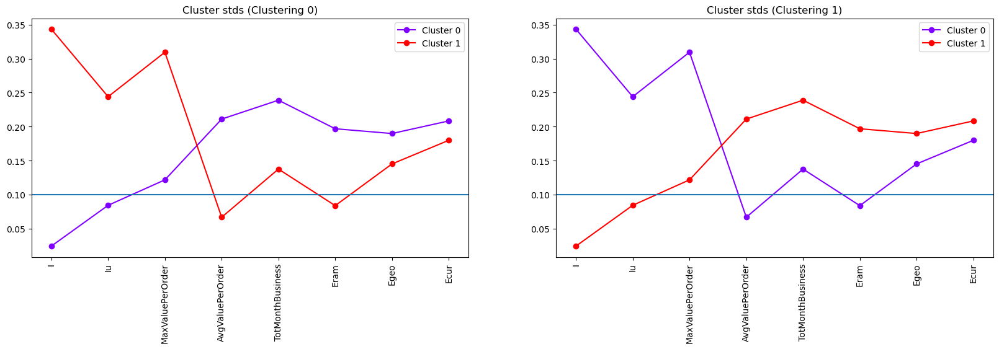

In [143]:
visualise_model_characteristics([vendor_norm, vendor_norm], [hier_clustering_avg_pca_res[0], kmeans_final], ["center", "std"])

#### Conclusion  
Average linkage didn't provide any new characterisation compared to the previous methods.

### Ward method

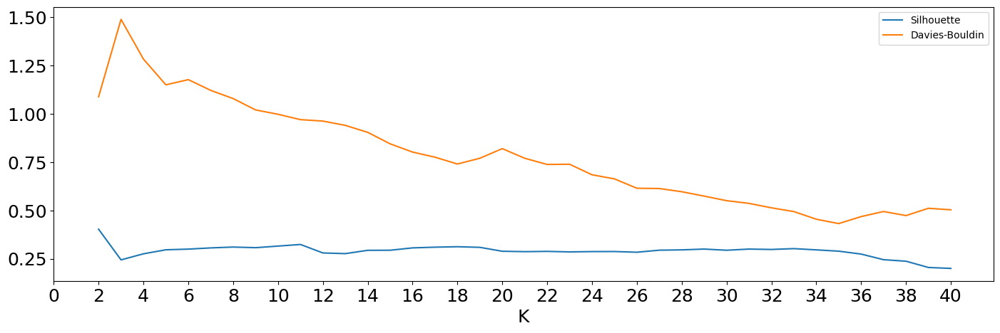

In [110]:
plot_metrics_per_k(vendor_norm, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="ward"))

Cophenetic coefficient: 0.6519277403479738


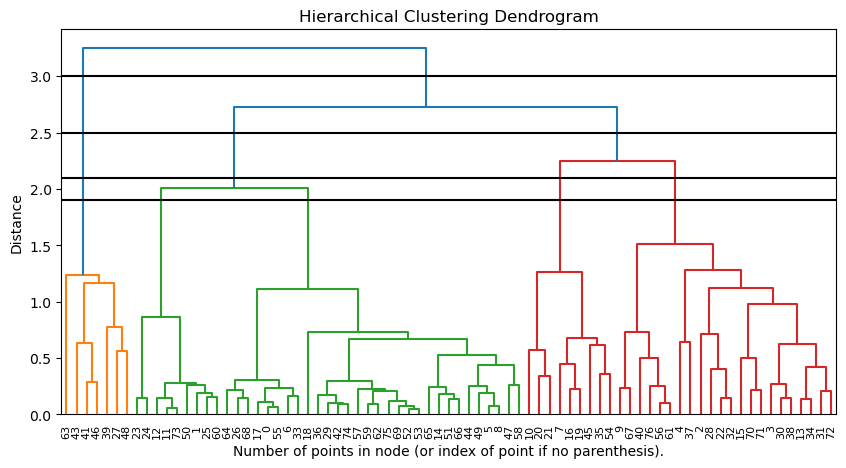

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 70, 1: 7}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 31, 1: 7, 2: 39}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 4
Number of points per cluster label: {0: 39, 1: 9, 2: 22, 3: 7}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 5
Number of points per cluster label: {0: 22, 1: 9, 2: 30, 3: 7, 4: 9}
Number of singleton clusters: 0




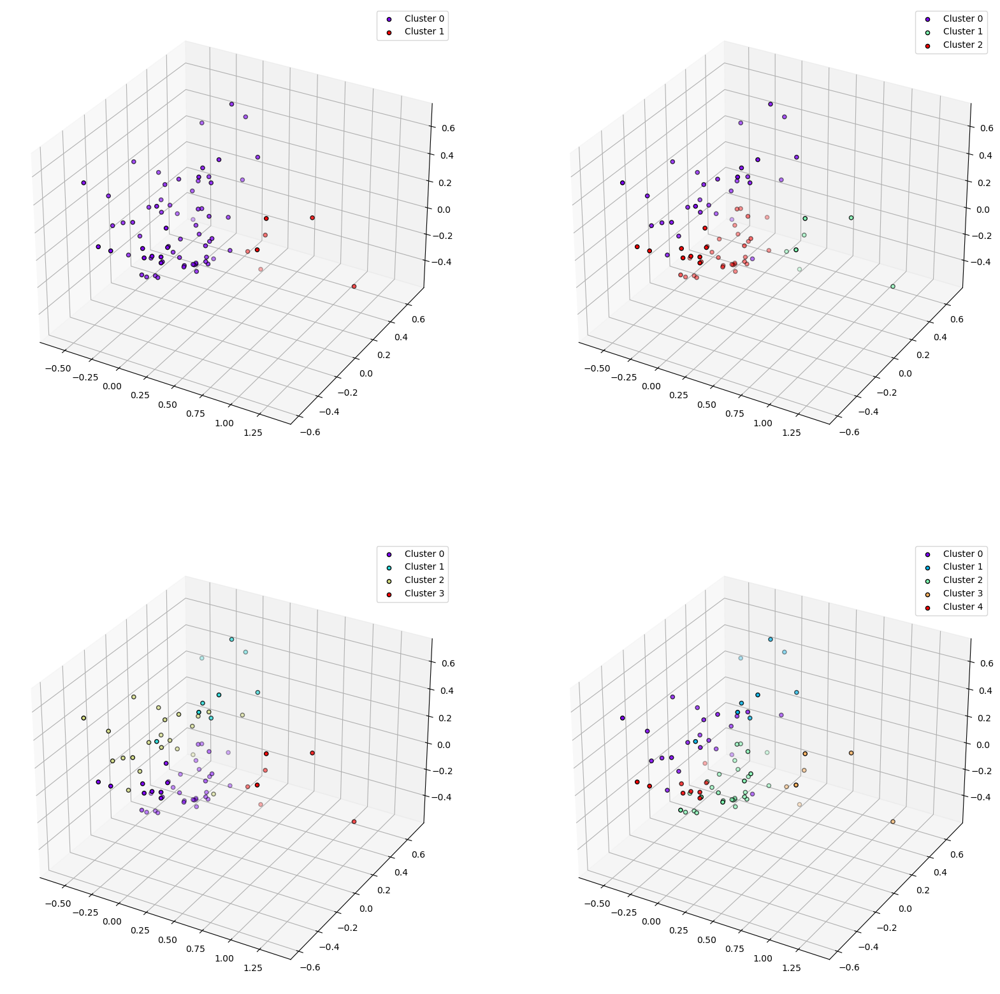

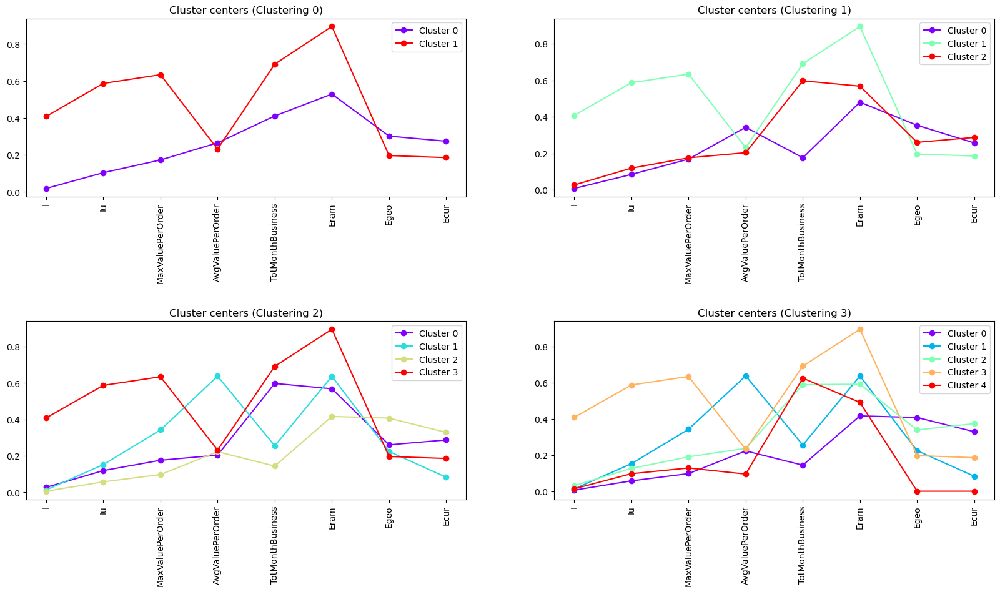

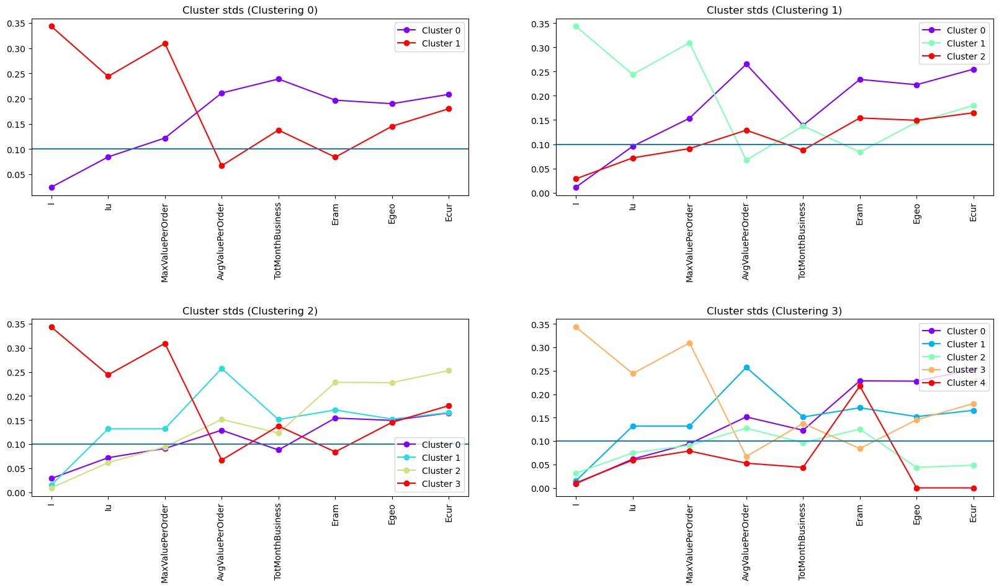

In [149]:
max_d = [3, 2.5, 2.1, 1.9]

hier_clustering_ward_res = []

for i in max_d:
    hier_clustering_ward_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="ward").fit(vendor_norm))

Z = linkage(vendor_norm, 'ward')
c, coph_dists = cophenet(Z, pdist(vendor_norm))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_ward_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_ward_res), hier_clustering_ward_res)

### Ward method (PCA)

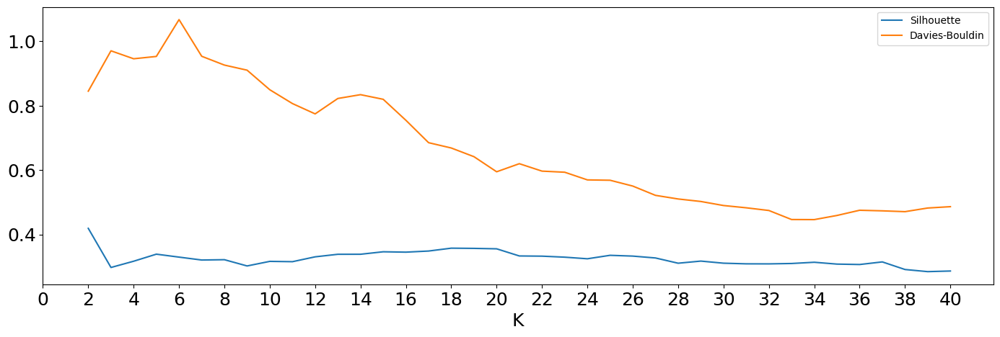

In [151]:
plot_metrics_per_k(vendor_pca, ["sil", "db"], model_sk=AgglomerativeClustering(compute_distances=True, n_clusters=1, linkage="ward"))

Cophenetic coefficient: 0.6801949991441593


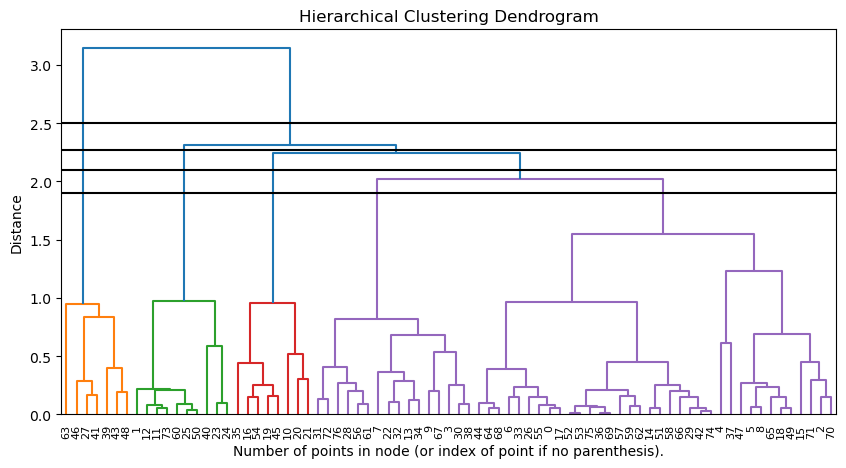

Clustering number 0
Number of clusters: 2
Number of points per cluster label: {0: 70, 1: 7}
Number of singleton clusters: 0


Clustering number 1
Number of clusters: 3
Number of points per cluster label: {0: 60, 1: 7, 2: 10}
Number of singleton clusters: 0


Clustering number 2
Number of clusters: 4
Number of points per cluster label: {0: 52, 1: 8, 2: 10, 3: 7}
Number of singleton clusters: 0


Clustering number 3
Number of clusters: 5
Number of points per cluster label: {0: 36, 1: 8, 2: 10, 3: 7, 4: 16}
Number of singleton clusters: 0




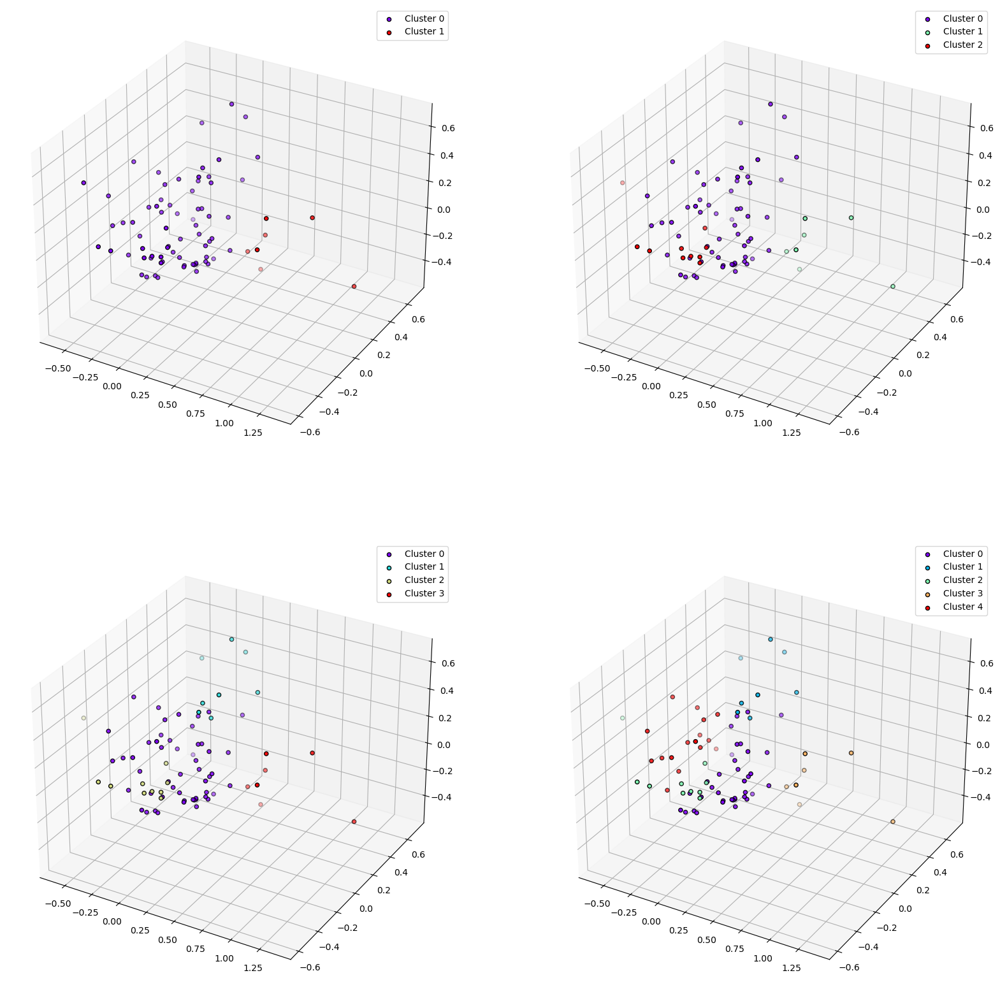

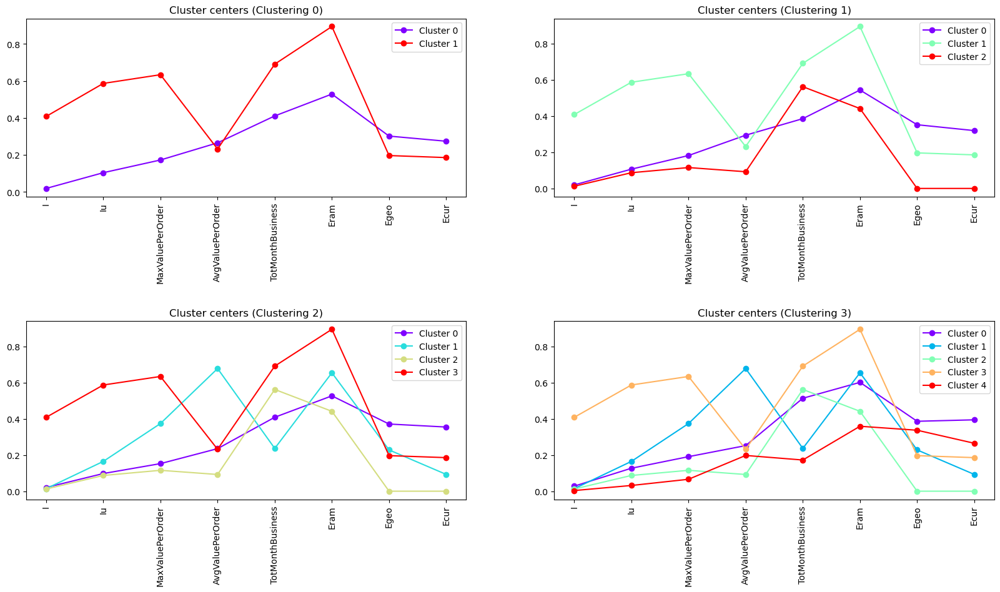

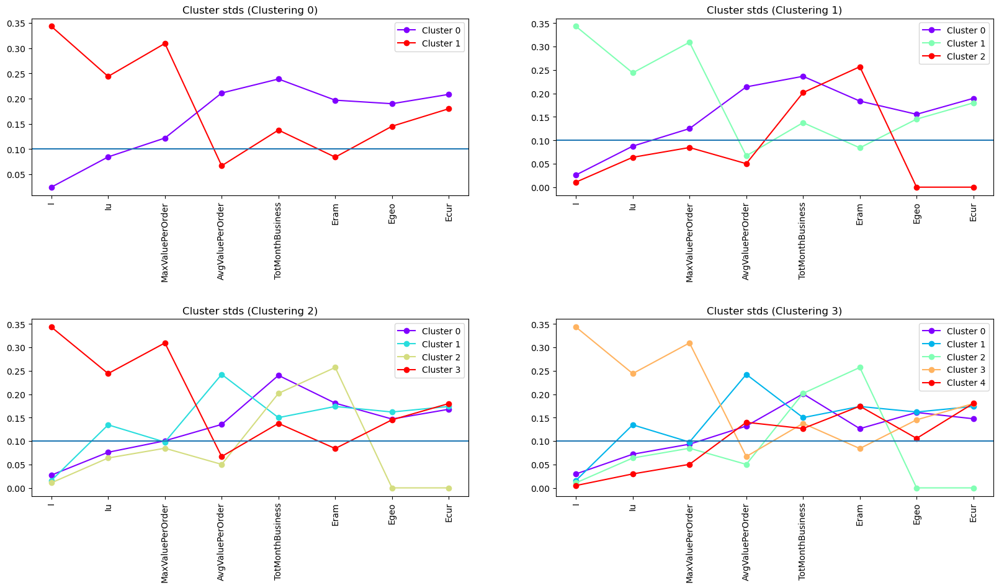

In [159]:
max_d = [2.5, 2.27, 2.1, 1.9]

hier_clustering_ward_pca_res = []

for i in max_d:
    hier_clustering_ward_pca_res.append(AgglomerativeClustering(distance_threshold=i, n_clusters=None, linkage="ward").fit(vendor_pca))

Z = linkage(vendor_pca, 'ward')
c, coph_dists = cophenet(Z, pdist(vendor_pca))
print(f"Cophenetic coefficient: {c}")

plot_dendrogram(hier_clustering_ward_pca_res[0], max_d, truncate_mode='level', p=20)
visualise_model_characteristics([vendor_norm]*len(hier_clustering_ward_pca_res), hier_clustering_ward_pca_res)

#### Conclusion  
The results are practically identical to Kmeans, this is mostly given to the fact that both methods try to minimise the global SSE of the clustering.

### Dendogram comparisons

## Clustering conclusions

In [160]:
def construct_clust_df(clust_dict):
    
    out_df = pd.DataFrame(columns=["Type", "Clusters", "Silhouette", "Davies-Bouldin", "Ideal corr"])
    
    for key in clust_dict:
        k = len(np.unique(clust_dict[key][0].labels_))

        sil_score = silhouette_score(clust_dict[key][1], clust_dict[key][0].labels_)
        db_score = davies_bouldin_score(clust_dict[key][1], clust_dict[key][0].labels_)
        id_corr_avg = np.mean(compute_ideal_similarity_coeff(clust_dict[key][1], clust_dict[key][0].labels_))

        entry_series = pd.Series({"Type":key, "Clusters":k, "Silhouette":sil_score, "Davies-Bouldin": db_score,
                                  "Ideal corr":id_corr_avg})
        out_df = out_df.append(entry_series, ignore_index=True)
        
    return out_df

In [ ]:
kmeans_dict = {"K-means with outliers":(kmeans_w_out, X_w_out), 
               "K-means without outliers":(kmeans_wo_out, X_wo_out), 
               "K-means with outliers (Ward)":(kmeans_w_out_ward, X_w_out),
               "K-means without outliers (Ward)":(kmeans_wo_out_ward, X_wo_out)}

xmeans_dict = {"X-means with outliers":(xmeans_w_out, X_w_out), 
               "X-means without outliers":(xmeans_wo_out, X_wo_out), 
               "X-means with outliers (Ward)":(xmeans_w_out_ward, X_w_out), 
               "X-means without outliers (Ward)":(xmeans_wo_out_ward, X_wo_out)}

density_dict = {"DBSCAN with outliers":(dbscan_w_out, X_w_out), 
                "DBSCAN without outliers":(dbscan_wo_out, X_wo_out), 
                "DBSCAN with outliers (PCA)":(dbscan_w_out_pca, X_pca_w_out), 
                "DBSCAN without outliers (PCA)":(dbscan_wo_out_pca, X_pca_wo_out)}

hier_dict = {"Single with outliers":(hier_clustering_single_w_out, X_w_out, "single"), 
             "Single without outliers":(hier_clustering_single_wo_out, X_wo_out, "single"), 
             "Single with outliers (PCA)":(hier_clustering_single_w_out_pca, X_pca_w_out, "single"), 
             "Single without outliers (PCA)":(hier_clustering_single_wo_out_pca, X_pca_wo_out, "single"),
             "Complete with outliers":(hier_clustering_complete_w_out, X_w_out, "complete"), 
             "Complete without outliers":(hier_clustering_complete_wo_out, X_wo_out, "complete"), 
             "Complete with outliers (PCA)":(hier_clustering_complete_w_out_pca, X_pca_w_out, "complete"), 
             "Complete without outliers (PCA)":(hier_clustering_complete_wo_out_pca, X_pca_wo_out, "complete"), 
             "Average with outliers":(hier_clustering_avg_w_out, X_w_out, "average"), 
             "Average without outliers":(hier_clustering_avg_wo_out, X_wo_out, "average"), 
             "Average with outliers (PCA)":(hier_clustering_avg_w_out_pca, X_pca_w_out, "average"),
             "Average without outliers (PCA)":(hier_clustering_avg_wo_out_pca, X_pca_wo_out, "average"), 
             "Ward with outliers":(hier_clustering_ward_w_out, X_w_out, "ward"), 
             "Ward without outliers":(hier_clustering_ward_wo_out, X_wo_out, "ward"), 
             "Ward with outliers (PCA)":(hier_clustering_ward_w_out_pca, X_pca_w_out, "ward"), 
             "Ward without outliers (PCA)":(hier_clustering_ward_wo_out_pca, X_pca_wo_out, "ward")}

In [ ]:
best_clust_dict_w_out = {"K-means with outliers (Ward)":(kmeans_w_out_ward, X_w_out),
    "Average with outliers (PCA)":(hier_clustering_avg_w_out_pca, X_pca_w_out, "average"),
    "Complete with outliers":(hier_clustering_complete_w_out, X_w_out, "complete"), 
    "Complete with outliers (PCA)":(hier_clustering_complete_w_out_pca, X_pca_w_out, "complete"), 
    "Ward with outliers":(hier_clustering_ward_w_out, X_w_out, "ward"), 
    "Ward with outliers (PCA)":(hier_clustering_ward_w_out_pca, X_pca_w_out, "ward")}

best_clust_dict_wo_out = {"K-means without outliers (Ward)":(kmeans_wo_out_ward, X_wo_out),
    "Average without outliers (PCA)":(hier_clustering_avg_wo_out_pca, X_pca_wo_out, "average"),
    "Complete without outliers":(hier_clustering_complete_wo_out, X_wo_out, "complete"),
    "Complete without outliers (PCA)":(hier_clustering_complete_wo_out_pca, X_pca_wo_out, "complete"),
    "Ward without outliers":(hier_clustering_ward_wo_out, X_wo_out, "ward"),
    "Ward without outliers (PCA)":(hier_clustering_ward_wo_out_pca, X_pca_wo_out, "ward")}

best_clust_df_w_out = construct_clust_df(best_clust_dict_w_out)
best_clust_df_wo_out = construct_clust_df(best_clust_dict_wo_out)

In [ ]:
best_clust_df_w_out.sort_values("Silhouette", ascending=False)

In [ ]:
plot_3d_scatter([vendor_df_w_out_vis, vendor_df_w_out_vis, vendor_df_w_out_vis, vendor_df_w_out_vis, vendor_df_w_out_vis, vendor_df_w_out_vis], 
                [hier_clustering_ward_w_out_pca.labels_, hier_clustering_avg_w_out_pca.labels_, 
                kmeans_w_out_ward.labels_, hier_clustering_ward_w_out.labels_, hier_clustering_complete_w_out_pca.labels_, 
                hier_clustering_complete_w_out.labels_])

Apart from the last two, the other results are pretty much identical.

In [ ]:
best_clust_df_wo_out.sort_values("Silhouette", ascending=False)

In [ ]:
plot_3d_scatter([vendor_df_wo_out_vis, vendor_df_wo_out_vis, vendor_df_wo_out_vis, vendor_df_wo_out_vis, vendor_df_wo_out_vis, vendor_df_wo_out_vis], 
                [hier_clustering_ward_wo_out_pca.labels_, hier_clustering_avg_wo_out_pca.labels_, hier_clustering_complete_wo_out_pca.labels_,
                hier_clustering_ward_wo_out.labels_, kmeans_wo_out_ward.labels_, hier_clustering_complete_wo_out.labels_])

Same as above.

# TODO  
Write dendogram paragraph  
Cluster visual evaluation matrix  
Clean-up and comment code